In [1]:
import pandas as pd
from process_bulk import ProcessBulk
import matplotlib.pyplot as plt
from process_geography import Ward, Region
import evaluation_helpers
import numpy as np
import os
from copy import deepcopy
import geopandas as gpd
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
import math

For more plots, see birmingham_analysis_plots

In [2]:
pd.options.mode.copy_on_write = True

For calculating the Townsend Deprivation Index, I need 4 different variables: 
    - Unemployment 
    - Non-car ownership (DC4202EW: Tenure by car or van availability by ethnic group of Household Reference Person (HRP))
    - Non-home ownership (means Tenure=not owned)
    - Overcrowding (persons per room)

In [3]:
DATA_DIR = "../census_data"
bulk_folder_name = "bulk_data"

ward_folder_name_tenure = "dc4201ew_htward"
ward_folder_name_occupancy = "dc4206ew_htward"
ward_folder_name_car = "dc4202ew_htward"
ward_folder_name_economic = "dc6201ew_htward"

index_sheet_name = "Cell Numbered DC Tables 3.2.xlsx"
index_sheet_name_economic = "Cell Numbered DC Tables 3.1.xlsx"

cl_folder_name = "confidence_intervals"
cl_sheet_name = "2011censusconfidenceintervalsdec2013_tcm77-271638.xlsx"
cl_table_name = "95% CI widths (LA level)"

p_cl = ProcessBulk(bulk_folder=cl_folder_name, index_sheet=cl_sheet_name)

p = ProcessBulk(bulk_folder=bulk_folder_name, index_sheet=index_sheet_name)

p_economic = ProcessBulk(
    bulk_folder=bulk_folder_name, index_sheet=index_sheet_name_economic
)

# Tenure by ethnic group by age - Household Reference Persons
table_name_tenure = "DC4201EW"
# Dwelling type by type of central heating in household by occupancy rating (bedrooms) by ethnic group of Household Reference Person (HRP)
table_name_occupancy = "DC4206EW"
# Tenure by car or van availability by ethnic group of Household Reference Person (HRP)
table_name_car = "DC4202EW"
# Economic activity by ethnic group by sex by age
table_name_economic = "DC6201EW"

In [4]:
dp_folder_name = "csv_files/datasets_dp_deprivation"
dp_folder_name_la = "csv_files/datasets_dp_deprivation_la"

path_tenure = os.path.join(
    p.get_bulk_data_path(), os.path.join(dp_folder_name, "tenure")
)
path_occupancy = os.path.join(
    p.get_bulk_data_path(), os.path.join(dp_folder_name, "occupancy")
)
path_car = os.path.join(p.get_bulk_data_path(), os.path.join(dp_folder_name, "car"))
path_economic = os.path.join(
    p.get_bulk_data_path(), os.path.join(dp_folder_name, "economic")
)
path_deprivation_scores = os.path.join(
    p.get_bulk_data_path(), os.path.join(dp_folder_name, "deprivation_scores")
)
path_indicators = os.path.join(
    p.get_bulk_data_path(), os.path.join(dp_folder_name, "deprivation_indicators")
)

path_tenure_la = os.path.join(
    p.get_bulk_data_path(), os.path.join(dp_folder_name_la, "tenure")
)
path_occupancy_la = os.path.join(
    p.get_bulk_data_path(), os.path.join(dp_folder_name_la, "occupancy")
)
path_car_la = os.path.join(
    p.get_bulk_data_path(), os.path.join(dp_folder_name_la, "car")
)
path_economic_la = os.path.join(
    p.get_bulk_data_path(), os.path.join(dp_folder_name_la, "economic")
)
path_deprivation_scores_la = os.path.join(
    p.get_bulk_data_path(), os.path.join(dp_folder_name_la, "deprivation_scores")
)
path_indicators_la = os.path.join(
    p.get_bulk_data_path(), os.path.join(dp_folder_name_la, "deprivation_indicators")
)

fig_folder_name = "figs/deprivation_index/maps"

In [5]:
epsilons_short = [0.001, 0.01, 0.1, 1]

In [6]:
# list of ethnicities for filtering
general_ethnicities = [
    "White: Total",
    "Mixed/multiple ethnic group: Total",
    "Asian/Asian British: Total",
    "Black/African/Caribbean/Black British: Total",
    "Other ethnic group: Total",
]
detailed_ethnicities = [
    "White: English/Welsh/Scottish/Northern Irish/British",
    "White: Irish",
    "White: Gypsy or Irish Traveller",
    "White: Other White",
    "Mixed/multiple ethnic group: White and Black Caribbean",
    "Mixed/multiple ethnic group: White and Black African",
    "Mixed/multiple ethnic group: White and Asian",
    "Mixed/multiple ethnic group: Other Mixed",
    "Asian/Asian British: Indian",
    "Asian/Asian British: Pakistani",
    "Asian/Asian British: Bangladeshi",
    "Asian/Asian British: Chinese",
    "Asian/Asian British: Other Asian",
    "Black/African/Caribbean/Black British: African",
    "Black/African/Caribbean/Black British: Caribbean",
    "Black/African/Caribbean/Black British: Other Black",
    "Other ethnic group: Arab",
    "Other ethnic group: Any other ethnic group",
]
white = ["White: English/Welsh/Scottish/Northern Irish/British"]

total_ethnicities = ["All categories: Ethnic group"]

# list of tenure categories for filtering
all_tenure = [
    "All categories: Tenure",
    "Owned or shared ownership: Total",
    "Owned: Owned outright",
    "Owned: Owned with a mortgage or loan or shared ownership",
    "Social rented: Total",
    "Social rented: Rented from council (Local Authority)",
    "Social rented: Other social rented",
    "Private rented or living rent free: Total",
    "Private rented: Private landlord or letting agency",
    "Private rented: Other private rented or living rent free",
]
general_tenure = [
    "Owned or shared ownership: Total",
    "Social rented: Total",
    "Private rented or living rent free: Total",
]
detailed_tenure = [
    "Owned: Owned outright",
    "Owned: Owned with a mortgage or loan or shared ownership",
    "Social rented: Rented from council (Local Authority)",
    "Social rented: Other social rented",
    "Private rented: Private landlord or letting agency",
    "Private rented: Other private rented or living rent free",
]

all_occupancy = [
    "All categories: Occupancy rating (bedrooms)",
    "Occupancy rating (bedrooms) of +2 or more",
    "Occupancy rating (bedrooms) of +1",
    "Occupancy rating (bedrooms) of 0",
    "Occupancy rating (bedrooms) of -1 or less",
]

detailed_occupancy = [
    "Occupancy rating (bedrooms) of +2 or more",
    "Occupancy rating (bedrooms) of +1",
    "Occupancy rating (bedrooms) of 0",
    "Occupancy rating (bedrooms) of -1 or less",
]

detailed_cars = [
    "No cars or vans in household",
    "1 car or van in household",
    "2 or more cars or vans in household",
]

all_economic = [
    "All categories: Economic activity",
    "Economically active: Total",
    "Economically active: In employment: Total",
    "Economically active: In employment: Employee: Total",
    "Economically active: In employment: Employee: Part-time",
    "Economically active: In employment: Employee: Full-time",
    "Economically active: In employment: Self-employed: Total",
    "Economically active: In employment: Self-employed: Part-time",
    "Economically active: In employment: Self-employed: Full-time",
    "Economically active: In employment: Full-time students",
    "Economically active: Unemployed: Total",
    "Economically active: Unemployed: Unemployed (excluding full time students)",
    "Economically active: Unemployed: Full-time students",
    "Economically inactive: Total",
    "Economically inactive: Retired",
    "Economically inactive: Student (including full-time students)",
    "Economically inactive: Looking after home or family",
    "Economically inactive: Long-term sick or disabled",
    "Economically inactive: Other",
]

economic_detailed = [
    "Economically active: In employment: Employee: Part-time",
    "Economically active: In employment: Employee: Full-time",
    "Economically active: In employment: Self-employed: Part-time",
    "Economically active: In employment: Self-employed: Full-time",
    "Economically active: In employment: Full-time students",
    "Economically active: Unemployed: Unemployed (excluding full time students)",
    "Economically active: Unemployed: Full-time students",
    "Economically inactive: Retired",
    "Economically inactive: Student (including full-time students)",
    "Economically inactive: Looking after home or family",
    "Economically inactive: Long-term sick or disabled",
    "Economically inactive: Other",
]

economic_inactive = [
    "Economically inactive: Retired",
    "Economically inactive: Student (including full-time students)",
    "Economically inactive: Looking after home or family",
    "Economically inactive: Long-term sick or disabled",
    "Economically inactive: Other",
]

In [7]:
ward = Ward()
geo_lookup = ward.get_geo_lookup_ward()

In [8]:
region = Region()
geo_lookup_region = region.get_geo_lookup_region()

In [9]:
geo_lookup_region_only = geo_lookup_region.drop(["LAD11CD", "LAD11NM"], axis=1)
geo_lookup_region_only.drop_duplicates(inplace=True)

In [10]:
def get_region_df(geo_lookup_region, region_code, gdf):
    region_list = geo_lookup_region.query("RGN11CD == @region_code")["LAD11CD"].tolist()
    gdf_region = gdf[gdf["LAD11CD"].isin(region_list)]
    return gdf_region

In [11]:
overview_wards = pd.read_csv(os.path.join(p.get_bulk_data_path(), "overview_wards.csv"))
overview_wards

,area_name,total,number_minorities,largest_groups,area_code
0,Brus,2891,16,"['White: Other White', 'Mixed/multiple ethnic ...",E36000001
1,Burn Valley,2522,14,"['White: Other White', 'White: Irish', 'Asian/...",E36000002
2,Dyke House,2186,15,"['White: Other White', 'White: Irish', 'Asian/...",E36000003
3,Elwick,830,9,"['White: Other White', 'Asian/Asian British: I...",E36000004
4,Fens,2159,7,"['White: Other White', 'White: Irish', 'Mixed/...",E36000005
...,...,...,...,...,...
8541,Penydarren,2100,16,"['White: Other White', 'Asian/Asian British: O...",W39000864
8542,Plymouth,2196,14,"['White: Other White', 'White: Irish', 'Mixed/...",W39000865
8543,Town,3294,14,"['White: Other White', 'White: Irish', 'Mixed/...",W39000866
8544,Treharris,2548,13,"['White: Other White', 'Asian/Asian British: I...",W39000867


In [12]:
london_list = geo_lookup_region.query('RGN11CD == "E12000007"')["LAD11CD"].tolist()
london_wards = geo_lookup[geo_lookup["LAD11CD"].isin(london_list)]
london_wards_list = london_wards["CMWD11CD"].tolist()
overview_wards_london = overview_wards[
    overview_wards["area_code"].isin(london_wards_list)
]
overview_wards_london

,area_name,total,number_minorities,largest_groups,area_code
7050,"Aldersgate,Cheap",876,14,"['White: Other White', 'Asian/Asian British: C...",E36007051
7051,"Aldgate,Billingsgate,Bishopsgate,Bridge,Broad ...",758,16,"['White: Other White', 'Asian/Asian British: B...",E36007052
7052,"Bassishaw,Coleman Street,Cripplegate",1647,15,"['White: Other White', 'Asian/Asian British: C...",E36007053
7053,"Bread Street,Castle Baynard,Cordwainer,Dowgate...",1104,14,"['White: Other White', 'Asian/Asian British: C...",E36007054
7054,Abbey,4572,13,['Black/African/Caribbean/Black British: Afric...,E36007055
...,...,...,...,...,...
7673,Tachbrook,4608,16,"['White: Other White', 'White: Irish', 'Asian/...",E36007674
7674,Vincent Square,5081,16,"['White: Other White', 'Black/African/Caribbea...",E36007675
7675,Warwick,5025,16,"['White: Other White', 'Asian/Asian British: O...",E36007676
7676,West End,5900,16,"['White: Other White', 'Other ethnic group: Ar...",E36007677


In [13]:
# loading shapefiles for creating a map

gdf_la = gpd.read_file(
    os.path.join(
        DATA_DIR, "geofiles", "Local_Authority_Districts_December_2011_FCB_EW.shp"
    ),
    ignore_fields=["lad11nmw", "lad11cdo"],
)
gdf_la.rename(columns={"lad11cd": "LAD11CD", "lad11nm": "LAD11NM"}, inplace=True)
gdf_wards = gpd.read_file(
    os.path.join(DATA_DIR, "geofiles", "CMWD_Dec_2011_GCB_in_England_and_Wales.shp"),
    ignore_fields=["lad11nmw", "cmwd11nmw"],
)
gdf_wards.rename(
    columns={
        "cmwd11cd": "CMWD11CD",
        "cmwd11nm": "CMWD11NM",
        "lad11cd": "LAD11CD",
        "lad11nm": "LAD11NM",
    },
    inplace=True,
)

/tmp/ipykernel_10323/436933244.py:3: DeprecationWarning: The 'include_fields' and 'ignore_fields' keywords are deprecated, and will be removed in a future release. You can use the 'columns' keyword instead to select which columns to read.
  gdf_la = gpd.read_file(
/tmp/ipykernel_10323/436933244.py:10: DeprecationWarning: The 'include_fields' and 'ignore_fields' keywords are deprecated, and will be removed in a future release. You can use the 'columns' keyword instead to select which columns to read.
  gdf_wards = gpd.read_file(


A higher deprivation score means that an area is more deprived, a lower score means it is less deprived and any scores around 0 are very close to the mean deprivation for the area
within the dataset.

In [14]:
indicators = pd.read_csv(os.path.join(path_indicators, "indicators_baseline"))
measurements = pd.read_csv(os.path.join(path_deprivation_scores, "baseline"))

indicators_la = pd.read_csv(os.path.join(path_indicators_la, "indicators_baseline"))
measurements_la = pd.read_csv(os.path.join(path_deprivation_scores_la, "baseline"))

measurements_la

,area_name,number_minorities,number_ethnicities,diversity,area_code,deprivation_score,quantile
0,South Gloucestershire,17,18,high,E06000025,-3.463504,0
1,North Somerset,17,18,high,E06000024,-3.008614,0
2,Stratford-on-Avon,17,18,high,E07000221,-4.087072,0
3,Elmbridge,17,18,high,E07000207,-3.326954,0
4,Malvern Hills,17,18,high,E07000235,-3.009731,0
...,...,...,...,...,...,...,...
343,Stoke-on-Trent,17,18,high,E06000021,3.218116,4
344,Blaenau Gwent,17,18,high,W06000019,3.322114,4
345,Middlesbrough,17,18,high,E06000002,5.399578,4
346,Merthyr Tydfil,17,18,high,W06000024,2.804034,4


In [15]:
cmap = plt.colormaps.get_cmap("RdYlGn")
cmap_reverse = cmap.reversed()

In [16]:
measurements_geometric_clipping = evaluation_helpers.read_dp_csvs(
    epsilons_short, path_deprivation_scores, "geometric_clipping"
)
indicators_geometric_clipping = pd.read_csv(
    os.path.join(path_indicators, "indicators_geometric_clipping")
)

measurements_geometric_clipping_la = evaluation_helpers.read_dp_csvs(
    epsilons_short, path_deprivation_scores_la, "geometric_clipping"
)
indicators_geometric_clipping_la = pd.read_csv(
    os.path.join(path_indicators_la, "indicators_geometric_clipping")
)

In [17]:
measurements_data_error = pd.read_csv(
    os.path.join(path_deprivation_scores, "data_error")
)
indicators_data_error = pd.read_csv(
    os.path.join(path_indicators, "indicators_data_error")
)

measurements_data_error_la = pd.read_csv(
    os.path.join(path_deprivation_scores_la, "data_error")
)
indicators_data_error_la = pd.read_csv(
    os.path.join(path_indicators_la, "indicators_data_error")
)

In [18]:
measurements_geometric_clipping_data_error = evaluation_helpers.read_dp_csvs(
    epsilons_short, path_deprivation_scores, "data_error_geometric_clipping"
)
indicators_data_error_geometric_clipping = pd.read_csv(
    os.path.join(path_indicators, "indicators_data_error_geometric_clipping")
)

measurements_geometric_clipping_data_error_la = evaluation_helpers.read_dp_csvs(
    epsilons_short, path_deprivation_scores_la, "data_error_geometric_clipping"
)
indicators_data_error_geometric_clipping_la = pd.read_csv(
    os.path.join(path_indicators_la, "indicators_data_error_geometric_clipping")
)

In [19]:
gdf_wards_measurements = gdf_wards.merge(
    measurements, left_on="CMWD11CD", right_on="area_code"
)

In [20]:
gdf_wards_overview = gdf_wards.merge(
    overview_wards, left_on="CMWD11CD", right_on="area_code"
)

In [21]:
gdf_wards_measurements_data_error = gdf_wards.merge(
    measurements_data_error, left_on="CMWD11CD", right_on="area_code"
)
gdf_data_error_merged_wards = evaluation_helpers.calculate_changes(
    gdf_wards_measurements_data_error, gdf_wards_measurements
)

In [22]:
gdf_wards_measurements_geometric_clipping = {}

for epsilon in epsilons_short:
    gdf_wards_measurements_geometric_clipping[epsilon] = gdf_wards.merge(
        measurements_geometric_clipping[epsilon],
        left_on="CMWD11CD",
        right_on="area_code",
    )

In [23]:
gdf_wards_measurements_geometric_clipping_data_error = {}

for epsilon in epsilons_short:
    gdf_wards_measurements_geometric_clipping_data_error[epsilon] = gdf_wards.merge(
        measurements_geometric_clipping_data_error[epsilon],
        left_on="CMWD11CD",
        right_on="area_code",
    )

In [24]:
gdf_geometric_clipping_merged = evaluation_helpers.merge_dfs_dp(
    gdf_wards_measurements_geometric_clipping, gdf_wards_measurements
)

In [25]:
gdf_geometric_clipping_data_error_merged = evaluation_helpers.merge_dfs_dp(
    gdf_wards_measurements_geometric_clipping_data_error, gdf_wards_measurements
)

In [26]:
gdf_london = get_region_df(geo_lookup_region, "E12000007", gdf_wards_measurements)
gdf_geometric_clipping_merged_london = get_region_df(
    geo_lookup_region, "E12000007", gdf_geometric_clipping_merged
)
gdf_geometric_clipping_data_error_merged_london = get_region_df(
    geo_lookup_region, "E12000007", gdf_geometric_clipping_data_error_merged
)
gdf_overview_london = gdf_london.merge(
    overview_wards_london, left_on="CMWD11CD", right_on="area_code"
)

In [27]:
gdf_wards_measurements_north_west = get_region_df(
    geo_lookup_region, "E12000002", gdf_wards_measurements
)

In [28]:
gdf_las_measurements = gdf_la.merge(
    measurements_la, left_on="LAD11CD", right_on="area_code"
)

In [29]:
gdf_las_measurements_data_error = gdf_la.merge(
    measurements_data_error, left_on="LAD11CD", right_on="area_code"
)
gdf_data_error_merged_las = evaluation_helpers.calculate_changes(
    gdf_las_measurements_data_error, gdf_las_measurements
)

In [30]:
gdf_las_measurements_geometric_clipping = {}

for epsilon in epsilons_short:
    gdf_las_measurements_geometric_clipping[epsilon] = gdf_la.merge(
        measurements_geometric_clipping_la[epsilon],
        left_on="LAD11CD",
        right_on="area_code",
    )

In [31]:
gdf_geometric_clipping_merged_la = evaluation_helpers.merge_dfs_dp(
    gdf_las_measurements_geometric_clipping, gdf_las_measurements
)

In [32]:
gdf_las_measurements_geometric_clipping_data_error = {}

for epsilon in epsilons_short:
    gdf_las_measurements_geometric_clipping_data_error[epsilon] = gdf_la.merge(
        measurements_geometric_clipping_data_error_la[epsilon],
        left_on="LAD11CD",
        right_on="area_code",
    )

In [33]:
gdf_geometric_clipping_data_error_merged_la = evaluation_helpers.merge_dfs_dp(
    gdf_las_measurements_geometric_clipping_data_error, gdf_las_measurements
)

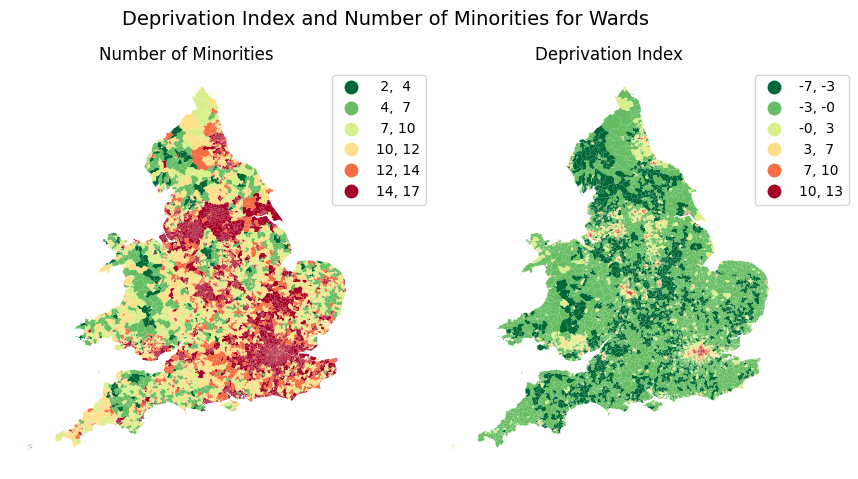

In [34]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5.5))
fig.suptitle("Deprivation Index and Number of Minorities for Wards", fontsize=14)
axs[0].set_axis_off()
axs[1].set_axis_off()
gdf_wards_measurements.plot(
    column="number_minorities",
    scheme="EqualInterval",
    k=6,
    ax=axs[0],
    legend=True,
    cmap=cmap_reverse,
    legend_kwds={"loc": "upper right", "bbox_to_anchor": (1.2, 1), "fmt": "{:.0f}"},
    rasterized=True,
)
gdf_wards_measurements.plot(
    column="deprivation_score",
    scheme="EqualInterval",
    k=6,
    ax=axs[1],
    legend=True,
    cmap=cmap_reverse,
    legend_kwds={"loc": "upper right", "bbox_to_anchor": (1.2, 1), "fmt": "{:.0f}"},
    rasterized=True,
)


axs[0].set_title("Number of Minorities")
axs[1].set_title("Deprivation Index")

plt.subplots_adjust(top=0.91)
plt.savefig(
    (os.path.join(fig_folder_name, f"map_deprivation_index_minorities_wards.png")),
    bbox_inches="tight",
)
plt.savefig(
    (os.path.join(fig_folder_name, f"map_deprivation_index_minorities_wards.svg")),
    bbox_inches="tight",
)

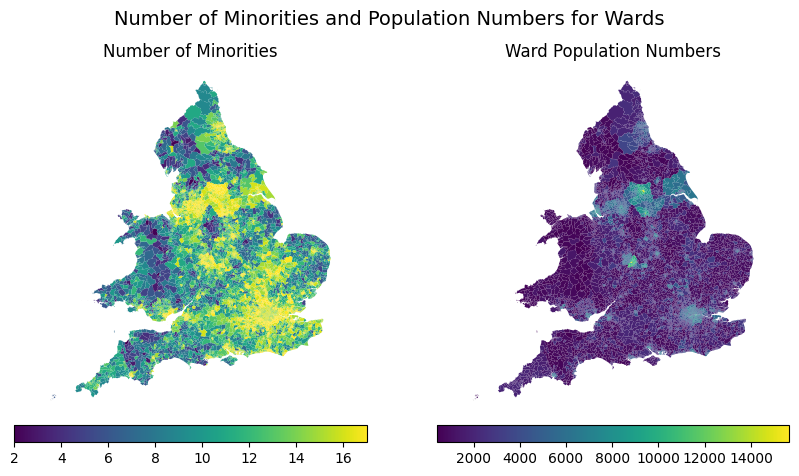

In [35]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5.5))
fig.suptitle("Number of Minorities and Population Numbers for Wards", fontsize=14)
axs[0].set_axis_off()
axs[1].set_axis_off()

gdf_wards_measurements.plot(
    column="number_minorities",
    ax=axs[0],
    legend=True,
    legend_kwds={"orientation": "horizontal", "pad": 0.02},
    rasterized=True,
)
gdf_wards_overview.plot(
    column="total",
    ax=axs[1],
    legend=True,
    legend_kwds={"orientation": "horizontal", "pad": 0.02},
    rasterized=True,
)


axs[0].set_title("Number of Minorities")
axs[1].set_title("Ward Population Numbers")

plt.subplots_adjust(top=0.88)
plt.savefig(
    (os.path.join(fig_folder_name, f"map_population_numbers_wards.png")),
    bbox_inches="tight",
)
plt.savefig(
    (os.path.join(fig_folder_name, f"map_population_numbers_wards.svg")),
    bbox_inches="tight",
)

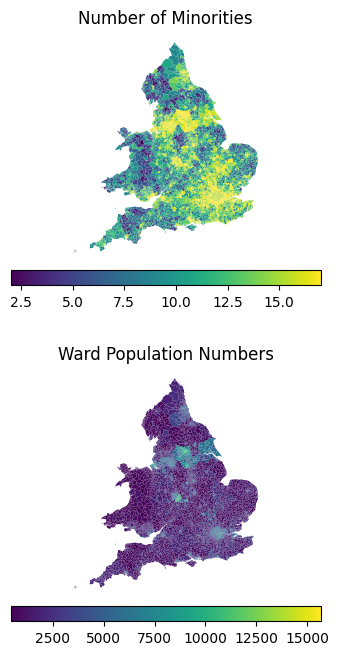

In [36]:
fig, axs = plt.subplots(2, 1, figsize=(4, 8))

axs[0].set_axis_off()
axs[1].set_axis_off()

gdf_wards_measurements.plot(
    column="number_minorities",
    ax=axs[0],
    legend=True,
    legend_kwds={"orientation": "horizontal", "pad": 0.02},
    rasterized=True,
)
gdf_wards_overview.plot(
    column="total",
    ax=axs[1],
    legend=True,
    legend_kwds={"orientation": "horizontal", "pad": 0.02},
    rasterized=True,
)

axs[0].set_title("Number of Minorities")
axs[1].set_title("Ward Population Numbers")

plt.subplots_adjust(top=0.88)
plt.savefig(
    (os.path.join(fig_folder_name, f"map_population_numbers_wards_2.png")),
    bbox_inches="tight",
)
plt.savefig(
    (os.path.join(fig_folder_name, f"map_population_numbers_wards_2.svg")),
    bbox_inches="tight",
)

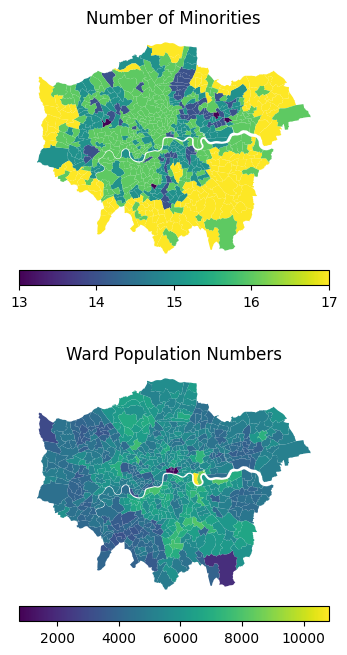

In [37]:
fig, axs = plt.subplots(2, 1, figsize=(4, 8))

axs[0].set_axis_off()
axs[1].set_axis_off()

gdf_london.plot(
    column="number_minorities",
    ax=axs[0],
    legend=True,
    legend_kwds={"orientation": "horizontal", "pad": 0.02},
    rasterized=True,
)
gdf_overview_london.plot(
    column="total",
    ax=axs[1],
    legend=True,
    legend_kwds={"orientation": "horizontal", "pad": 0.02},
    rasterized=True,
)

axs[0].set_title("Number of Minorities")
axs[1].set_title("Ward Population Numbers")

plt.savefig(
    (os.path.join(fig_folder_name, f"map_population_numbers_london_2.png")),
    bbox_inches="tight",
)
plt.savefig(
    (os.path.join(fig_folder_name, f"map_population_numbers_london_2.svg")),
    bbox_inches="tight",
)

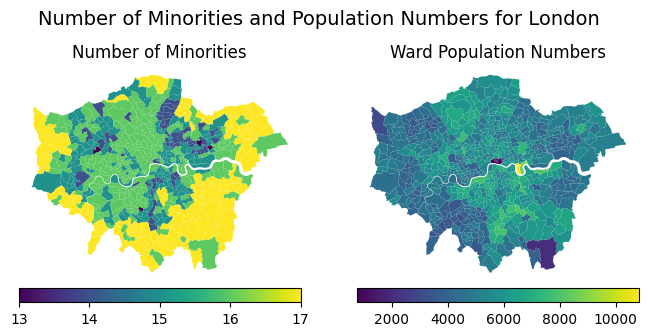

In [38]:
fig, axs = plt.subplots(1, 2, figsize=(8, 3.7))
fig.suptitle("Number of Minorities and Population Numbers for London", fontsize=14)
axs[0].set_axis_off()
axs[1].set_axis_off()

gdf_london.plot(
    column="number_minorities",
    ax=axs[0],
    legend=True,
    legend_kwds={"orientation": "horizontal", "pad": 0.02},
    rasterized=True,
)
gdf_overview_london.plot(
    column="total",
    ax=axs[1],
    legend=True,
    legend_kwds={"orientation": "horizontal", "pad": 0.02},
    rasterized=True,
)

axs[0].set_title("Number of Minorities")
axs[1].set_title("Ward Population Numbers")

plt.savefig(
    (os.path.join(fig_folder_name, f"map_population_numbers_london.png")),
    bbox_inches="tight",
)
plt.savefig(
    (os.path.join(fig_folder_name, f"map_population_numbers_london.svg")),
    bbox_inches="tight",
)

In [39]:
def create_maps_with_norm(
    epsilons,
    measurement_df,
    column_name,
    cmap,
    title,
    file_name,
    base=True,
    base_name="Ground Truth",
):
    if base:
        fig, axs = plt.subplots(2, 3, figsize=(12, 8))
        fig.suptitle(title, fontsize=14)

        vmin = measurement_df[column_name].min()
        vmax = measurement_df[column_name].max()

        i = 0
        j = 0

        for epsilon in epsilons:
            if j == 3:
                j = 0
                i += 1
            df = measurement_df.loc[epsilon]
            axs[i][j].set_axis_off()

            df.plot(
                column=column_name,
                cmap=cmap,
                vmin=vmin,
                vmax=vmax,
                ax=axs[i][j],
                legend=True,
                legend_kwds={"orientation": "horizontal", "pad": 0.02},
                rasterized=True,
            )

            axs[i][j].set_title(f"Epsilon = {epsilon}", fontsize=11)
            j += 1

        axs[i][j].set_axis_off()
        measurement_df.loc[0].plot(
            column=column_name,
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            ax=axs[i][j],
            legend=True,
            legend_kwds={"orientation": "horizontal", "pad": 0.02},
            rasterized=True,
        )
        axs[i][j].set_title(base_name, fontsize=11)
        fig.delaxes(axs[i, j + 1])

        plt.subplots_adjust(top=0.91)
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.png")), bbox_inches="tight"
        )
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.svg")), bbox_inches="tight"
        )
    else:
        fig, axs = plt.subplots(2, 2, figsize=(7, 8))
        fig.suptitle(title, fontsize=14)

        vmin = measurement_df[column_name].min()
        vmax = measurement_df[column_name].max()

        i = 0
        j = 0

        for epsilon in epsilons:
            if j == 2:
                j = 0
                i += 1
            df = measurement_df.loc[epsilon]
            axs[i][j].set_axis_off()

            df.plot(
                column=column_name,
                cmap=cmap,
                vmin=vmin,
                vmax=vmax,
                ax=axs[i][j],
                legend=True,
                legend_kwds={"orientation": "horizontal", "pad": 0.02},
                rasterized=True,
            )

            axs[i][j].set_title(f"Epsilon = {epsilon}", fontsize=11)
            j += 1

        plt.subplots_adjust(top=0.91)
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.png")), bbox_inches="tight"
        )
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.svg")), bbox_inches="tight"
        )

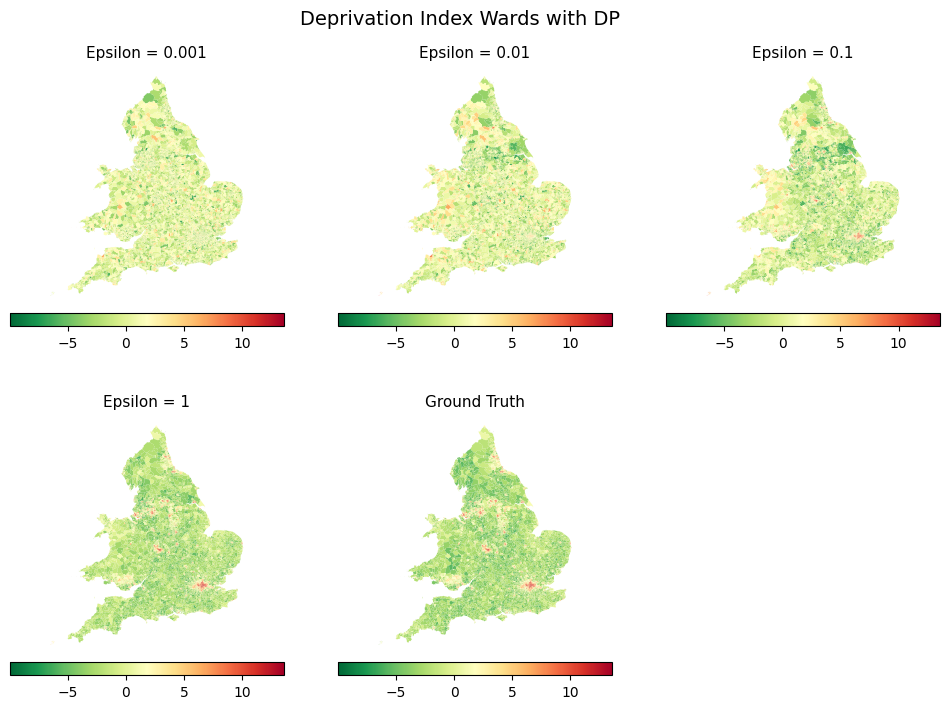

In [40]:
create_maps_with_norm(
    epsilons_short,
    gdf_geometric_clipping_merged,
    "deprivation_score",
    cmap_reverse,
    "Deprivation Index Wards with DP",
    "map_deprivation_norm_wards",
)

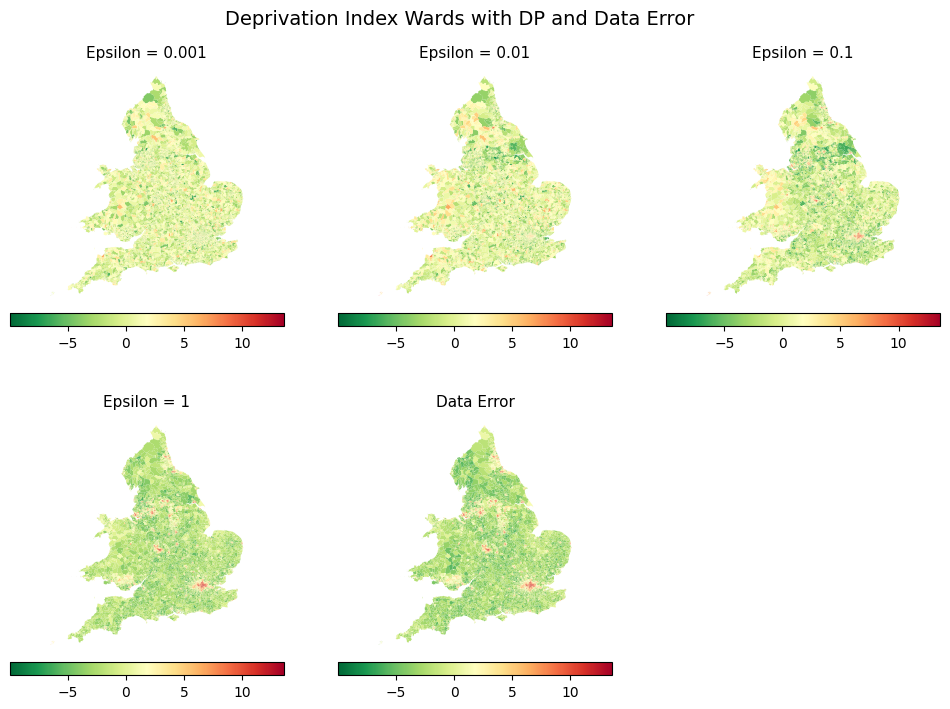

In [41]:
create_maps_with_norm(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged,
    "deprivation_score",
    cmap_reverse,
    "Deprivation Index Wards with DP and Data Error",
    "map_deprivation_norm_wards",
    base=True,
    base_name="Data Error",
)

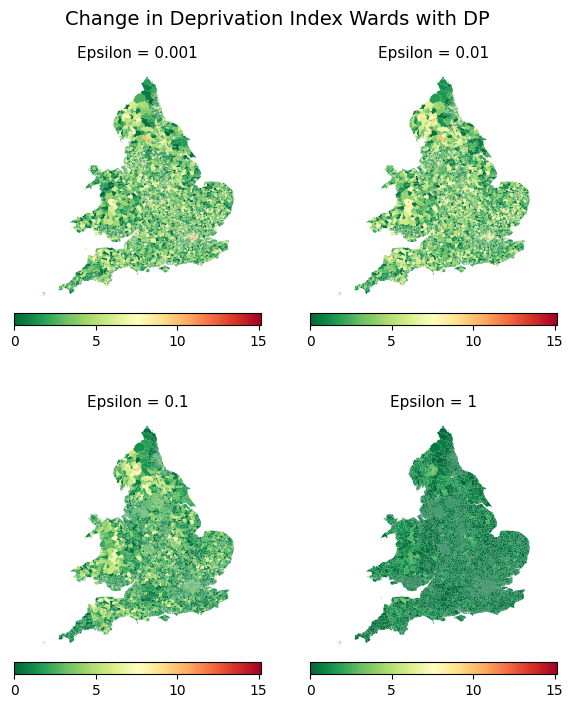

In [42]:
create_maps_with_norm(
    epsilons_short,
    gdf_geometric_clipping_merged,
    "change_in_score",
    cmap_reverse,
    "Change in Deprivation Index Wards with DP",
    "map_deprivation_norm_wards_change_score",
    base=False,
)

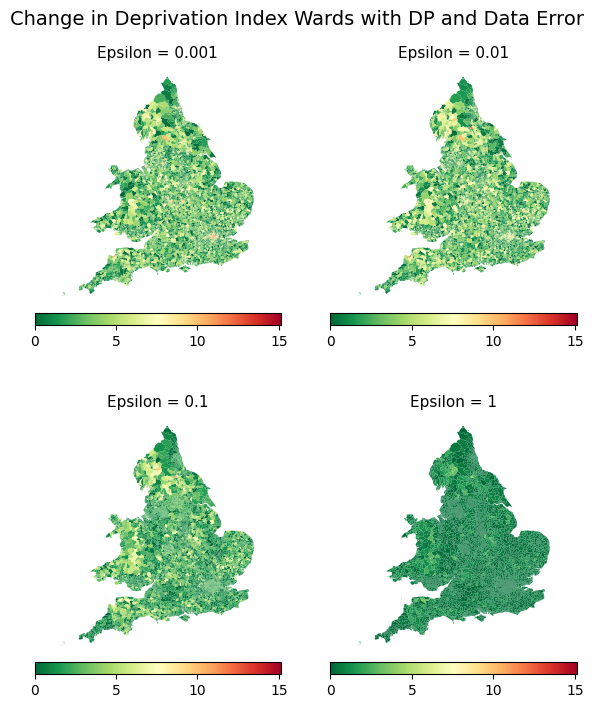

In [43]:
create_maps_with_norm(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged,
    "change_in_score",
    cmap_reverse,
    "Change in Deprivation Index Wards with DP and Data Error",
    "map_deprivation_norm_wards_change_score_dp_data_error",
    base=False,
)

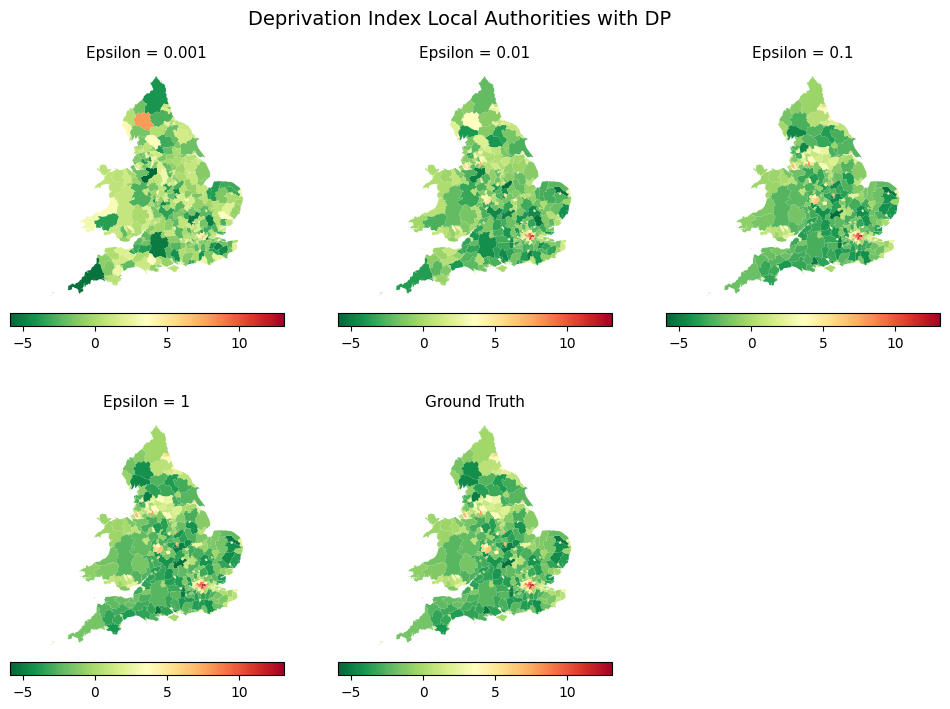

In [44]:
create_maps_with_norm(
    epsilons_short,
    gdf_geometric_clipping_merged_la,
    "deprivation_score",
    cmap_reverse,
    "Deprivation Index Local Authorities with DP",
    "map_deprivation_norm_la",
)

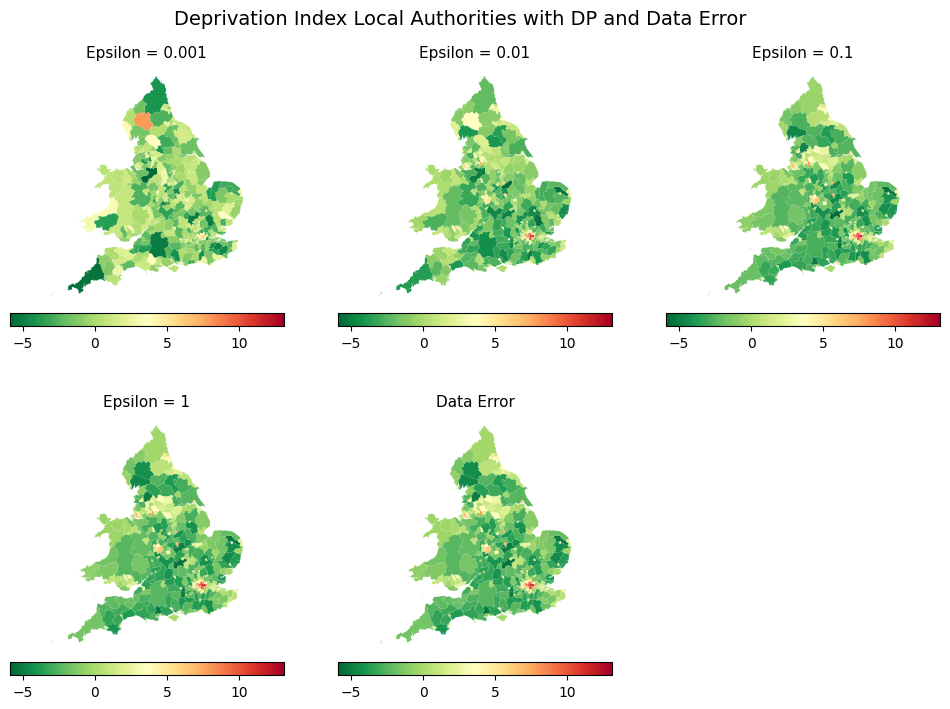

In [45]:
create_maps_with_norm(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged_la,
    "deprivation_score",
    cmap_reverse,
    "Deprivation Index Local Authorities with DP and Data Error",
    "map_deprivation_norm_la_dp_data_error",
    base=True,
    base_name="Data Error",
)

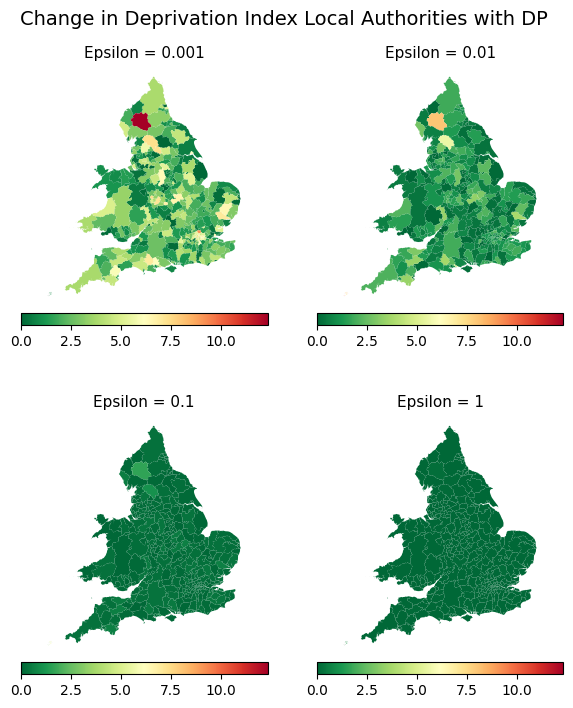

In [46]:
create_maps_with_norm(
    epsilons_short,
    gdf_geometric_clipping_merged_la,
    "change_in_score",
    cmap_reverse,
    "Change in Deprivation Index Local Authorities with DP",
    "map_deprivation_norm_wards_change_score_la",
    base=False,
)

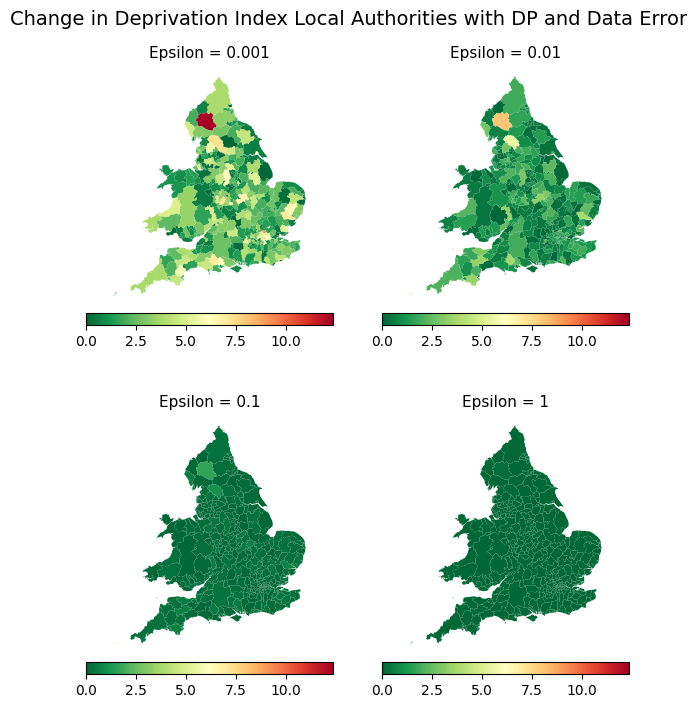

In [47]:
create_maps_with_norm(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged_la,
    "change_in_score",
    cmap_reverse,
    "Change in Deprivation Index Local Authorities with DP and Data Error",
    "map_deprivation_norm_wards_change_score_la_dp_data_error",
    base=False,
)

In [48]:
def create_maps_interval(
    epsilons,
    measurement_df,
    k,
    column_name,
    cmap,
    title,
    file_name,
    base=True,
    base_name="Ground Truth",
):
    vmin = measurement_df[column_name].min()
    vmax = measurement_df[column_name].max()

    bins = np.linspace(math.floor(vmin), math.ceil(vmax), num=k, dtype=int)
    bins = np.delete(bins, 0)

    if base:
        fig, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
        fig.suptitle(title, fontsize=14)

        i = 0
        j = 0

        for epsilon in epsilons:
            if j == 3:
                j = 0
                i += 1
            df = measurement_df.loc[epsilon]
            axs[i][j].set_axis_off()

            df.plot(
                column=column_name,
                scheme="User_Defined",
                ax=axs[i][j],
                cmap=cmap,
                legend=True,
                legend_kwds={
                    "loc": "upper right",
                    "bbox_to_anchor": (1.36, 1),
                    "fmt": "{:.0f}",
                },
                rasterized=True,
                classification_kwds=dict(lowest=vmin, bins=bins),
            )

            axs[i][j].set_title(f"Epsilon = {epsilon}", fontsize=11)
            j += 1

        axs[i][j].set_axis_off()
        measurement_df.loc[0].plot(
            column=column_name,
            scheme="User_Defined",
            ax=axs[i][j],
            cmap=cmap,
            legend=True,
            legend_kwds={
                "loc": "upper right",
                "bbox_to_anchor": (1.36, 1),
                "fmt": "{:.0f}",
            },
            rasterized=True,
            classification_kwds=dict(lowest=vmin, bins=bins),
        )
        axs[i][j].set_title(base_name, fontsize=11)
        fig.delaxes(axs[i, j + 1])
        plt.subplots_adjust(top=0.91)
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.png")), bbox_inches="tight"
        )
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.svg")), bbox_inches="tight"
        )
    else:
        fig, axs = plt.subplots(2, 2, figsize=(7, 8))
        fig.suptitle(title, fontsize=14)

        i = 0
        j = 0

        for epsilon in epsilons:
            if j == 2:
                j = 0
                i += 1
            df = measurement_df.loc[epsilon]
            axs[i][j].set_axis_off()

            df.plot(
                column=column_name,
                scheme="User_Defined",
                cmap=cmap,
                ax=axs[i][j],
                legend=True,
                legend_kwds={
                    "loc": "upper right",
                    "bbox_to_anchor": (1.36, 1),
                    "fmt": "{:.0f}",
                },
                rasterized=True,
                classification_kwds=dict(lowest=vmin, bins=bins),
            )

            axs[i][j].set_title(f"Epsilon = {epsilon}", fontsize=11)
            j += 1

        plt.subplots_adjust(top=0.91)
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.png")), bbox_inches="tight"
        )
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.svg")), bbox_inches="tight"
        )

In [49]:
def create_maps_interval_data_error_ground_truth(
    epsilons,
    measurement_df_data_error,
    measurement_df,
    k,
    column_name,
    cmap,
    title,
    file_name,
):

    fig, axs = plt.subplots(2, 3, figsize=(10.5, 7.5))
    fig.suptitle(title, fontsize=14)

    i = 0
    j = 0

    vmin = measurement_df[column_name].min()
    vmax = measurement_df[column_name].max()

    bins = np.linspace(math.floor(vmin), math.ceil(vmax), num=k, dtype=int)
    bins = np.delete(bins, 0)

    for epsilon in epsilons:
        if j == 3:
            j = 0
            i += 1
        df = measurement_df_data_error.loc[epsilon]
        axs[i][j].set_axis_off()

        df.plot(
            column=column_name,
            scheme="User_Defined",
            ax=axs[i][j],
            cmap=cmap,
            legend=True,
            legend_kwds={
                "loc": "upper right",
                "bbox_to_anchor": (1.36, 1),
                "fmt": "{:.0f}",
                "fontsize": 8,
                "markerscale": 0.8,
            },
            rasterized=True,
            classification_kwds=dict(lowest=vmin, bins=bins),
        )

        axs[i][j].set_title(f"Epsilon = {epsilon}", fontsize=11)
        j += 1

    # creating map for data error
    axs[i][j].set_axis_off()
    measurement_df_data_error.loc[0].plot(
        column=column_name,
        scheme="User_Defined",
        ax=axs[i][j],
        cmap=cmap,
        legend=True,
        legend_kwds={
            "loc": "upper right",
            "bbox_to_anchor": (1.36, 1),
            "fmt": "{:.0f}",
            "fontsize": 8,
            "markerscale": 0.8,
        },
        rasterized=True,
        classification_kwds=dict(lowest=vmin, bins=bins),
    )
    axs[i][j].set_title("Data Error", fontsize=11)

    # creating map for ground truth
    axs[i][j + 1].set_axis_off()
    measurement_df.loc[0].plot(
        column=column_name,
        scheme="User_Defined",
        ax=axs[i][j + 1],
        cmap=cmap,
        legend=True,
        legend_kwds={
            "loc": "upper right",
            "bbox_to_anchor": (1.36, 1),
            "fmt": "{:.0f}",
            "fontsize": 8,
            "markerscale": 0.8,
        },
        rasterized=True,
        classification_kwds=dict(lowest=vmin, bins=bins),
    )
    axs[i][j + 1].set_title("Ground Truth", fontsize=11)

    fig.subplots_adjust(top=0.91, wspace=0.1, hspace=0.15)
    plt.savefig(
        (os.path.join(fig_folder_name, f"{file_name}.png")), bbox_inches="tight"
    )
    plt.savefig(
        (os.path.join(fig_folder_name, f"{file_name}.svg")), bbox_inches="tight"
    )

In [50]:
def create_maps_interval_data_error_ground_truth_no_norm(
    epsilons,
    measurement_df_data_error,
    measurement_df,
    k,
    column_name,
    cmap,
    title,
    file_name,
):

    fig, axs = plt.subplots(2, 3, figsize=(12, 8))
    fig.suptitle(title, fontsize=14)

    i = 0
    j = 0

    for epsilon in epsilons:
        if j == 3:
            j = 0
            i += 1
        df = measurement_df_data_error.loc[epsilon]
        axs[i][j].set_axis_off()

        df.plot(
            column=column_name,
            scheme="EqualInterval",
            k=k,
            ax=axs[i][j],
            cmap=cmap,
            legend=True,
            legend_kwds={
                "loc": "upper right",
                "bbox_to_anchor": (1.36, 1),
                "fmt": "{:.0f}",
            },
            rasterized=True,
        )

        axs[i][j].set_title(f"Epsilon = {epsilon}", fontsize=11)
        j += 1

    # creating map for data error
    axs[i][j].set_axis_off()
    measurement_df_data_error.loc[0].plot(
        column=column_name,
        scheme="EqualInterval",
        k=k,
        ax=axs[i][j],
        cmap=cmap,
        legend=True,
        legend_kwds={
            "loc": "upper right",
            "bbox_to_anchor": (1.36, 1),
            "fmt": "{:.0f}",
        },
        rasterized=True,
    )
    axs[i][j].set_title("Data Error", fontsize=11)

    # creating map for ground truth
    axs[i][j + 1].set_axis_off()
    measurement_df.loc[0].plot(
        column=column_name,
        scheme="EqualInterval",
        k=k,
        ax=axs[i][j + 1],
        cmap=cmap,
        legend=True,
        legend_kwds={
            "loc": "upper right",
            "bbox_to_anchor": (1.36, 1.7),
            "fmt": "{:.0f}",
        },
        rasterized=True,
    )
    axs[i][j + 1].set_title("Ground Truth", fontsize=11)

    plt.subplots_adjust(top=0.91)
    plt.savefig(
        (os.path.join(fig_folder_name, f"{file_name}_no_norm.png")), bbox_inches="tight"
    )
    plt.savefig(
        (os.path.join(fig_folder_name, f"{file_name}_no_norm.svg")), bbox_inches="tight"
    )

In [51]:
def create_maps_interval_data_error_ground_truth_region(
    epsilons,
    measurement_df_data_error,
    measurement_df,
    k,
    column_name,
    cmap,
    title,
    file_name,
):

    fig, axs = plt.subplots(2, 3, figsize=(10.5, 6.7))
    fig.suptitle(title, fontsize=14)

    i = 0
    j = 0

    vmin = measurement_df[column_name].min()
    vmax = measurement_df[column_name].max()

    bins = np.linspace(math.floor(vmin), math.ceil(vmax), num=k, dtype=int)
    bins = np.delete(bins, 0)

    for epsilon in epsilons:
        if j == 3:
            j = 0
            i += 1
        df = measurement_df_data_error.loc[epsilon]
        axs[i][j].set_axis_off()

        df.plot(
            column=column_name,
            scheme="User_Defined",
            ax=axs[i][j],
            cmap=cmap,
            legend=True,
            legend_kwds={
                "loc": "lower left",
                "ncol": k / 2,
                "bbox_to_anchor": (0, -0.2),
                "fmt": "{:.0f}",
                "fontsize": 8,
                "markerscale": 0.8,
            },
            rasterized=True,
            classification_kwds=dict(lowest=vmin, bins=bins),
        )

        axs[i][j].set_title(f"Epsilon = {epsilon}", fontsize=11)
        j += 1

    # creating map for data error
    axs[i][j].set_axis_off()
    measurement_df_data_error.loc[0].plot(
        column=column_name,
        scheme="User_Defined",
        ax=axs[i][j],
        cmap=cmap,
        legend=True,
        legend_kwds={
            "loc": "lower left",
            "ncol": k / 2,
            "bbox_to_anchor": (0, -0.2),
            "fmt": "{:.0f}",
            "fontsize": 8,
            "markerscale": 0.8,
        },
        rasterized=True,
        classification_kwds=dict(lowest=vmin, bins=bins),
    )

    axs[i][j].set_title("Data Error", fontsize=11)

    # creating map for ground truth
    axs[i][j + 1].set_axis_off()
    measurement_df.loc[0].plot(
        column=column_name,
        scheme="User_Defined",
        ax=axs[i][j + 1],
        cmap=cmap,
        legend=True,
        legend_kwds={
            "loc": "lower left",
            "ncol": k / 2,
            "bbox_to_anchor": (0, -0.2),
            "fmt": "{:.0f}",
            "fontsize": 8,
            "markerscale": 0.8,
        },
        rasterized=True,
        classification_kwds=dict(lowest=vmin, bins=bins),
    )

    axs[i][j + 1].set_title("Ground Truth", fontsize=11)

    fig.subplots_adjust(top=0.95, wspace=0.1, hspace=0.1)
    plt.savefig(
        (os.path.join(fig_folder_name, f"{file_name}.png")), bbox_inches="tight"
    )
    plt.savefig(
        (os.path.join(fig_folder_name, f"{file_name}.svg")), bbox_inches="tight"
    )

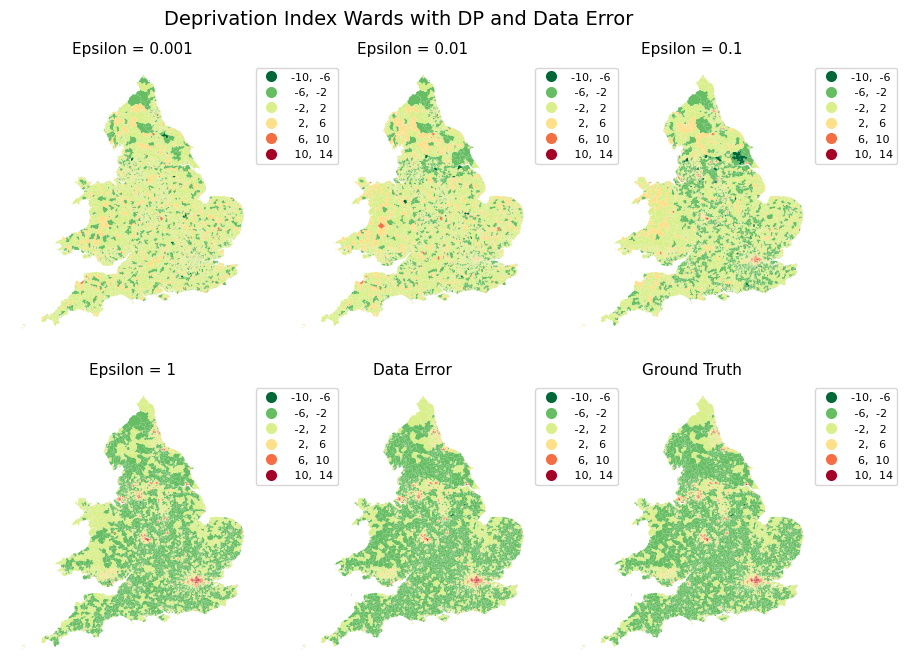

In [52]:
create_maps_interval_data_error_ground_truth(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged,
    gdf_geometric_clipping_merged,
    7,
    "deprivation_score",
    cmap_reverse,
    "Deprivation Index Wards with DP and Data Error",
    "map_deprivation_interval_wards_full",
)

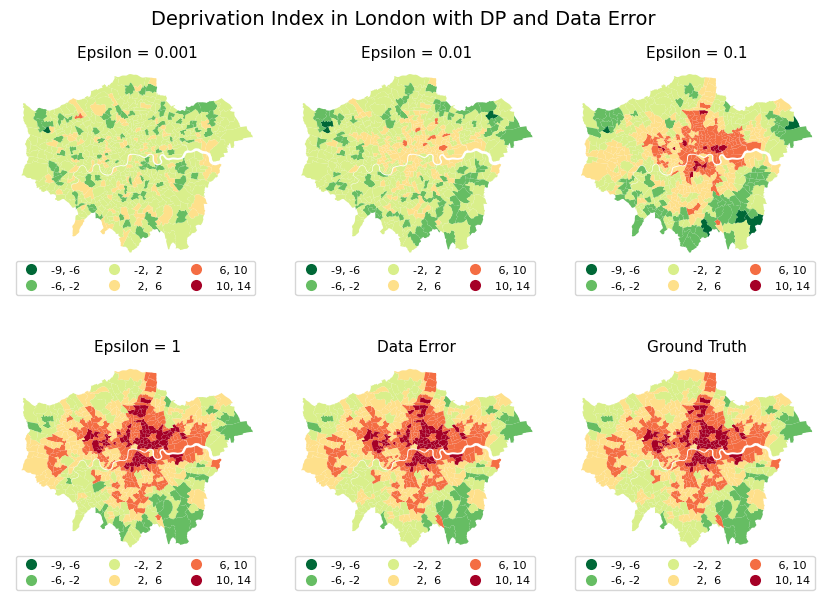

In [53]:
create_maps_interval_data_error_ground_truth_region(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged_london,
    gdf_geometric_clipping_merged_london,
    7,
    "deprivation_score",
    cmap_reverse,
    "Deprivation Index in London with DP and Data Error",
    "map_deprivation_interval_london",
)

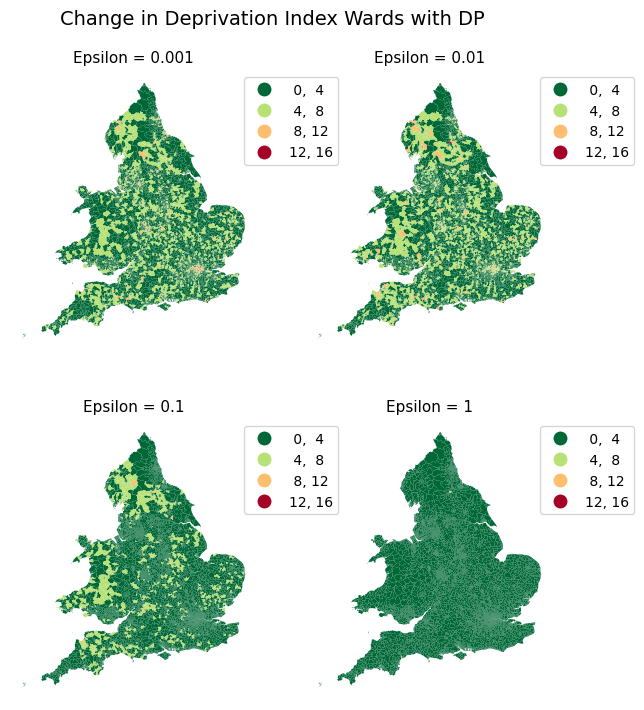

In [54]:
create_maps_interval(
    epsilons_short,
    gdf_geometric_clipping_merged,
    5,
    "change_in_score",
    cmap_reverse,
    "Change in Deprivation Index Wards with DP",
    "map_deprivation_interval_wards_change_score",
    base=False,
)

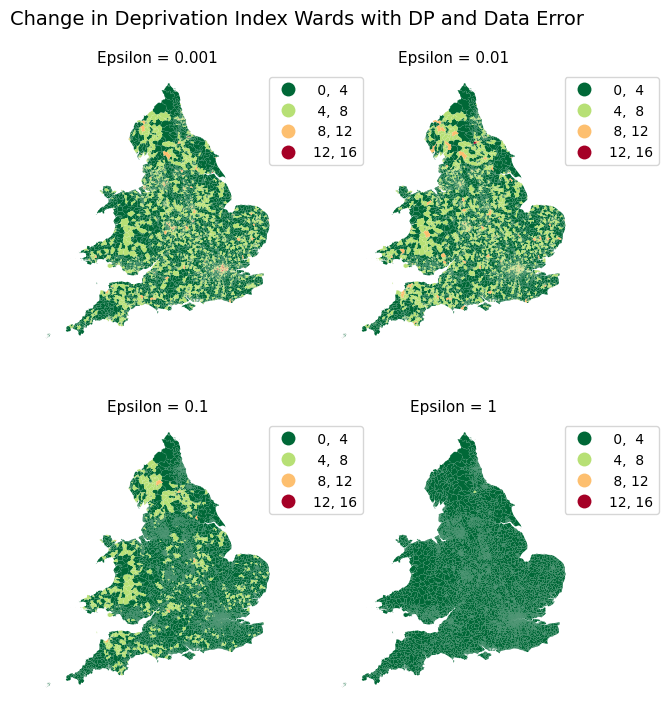

In [55]:
create_maps_interval(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged,
    5,
    "change_in_score",
    cmap_reverse,
    "Change in Deprivation Index Wards with DP and Data Error",
    "map_deprivation_interval_wards_change_score_data_error",
    base=False,
)

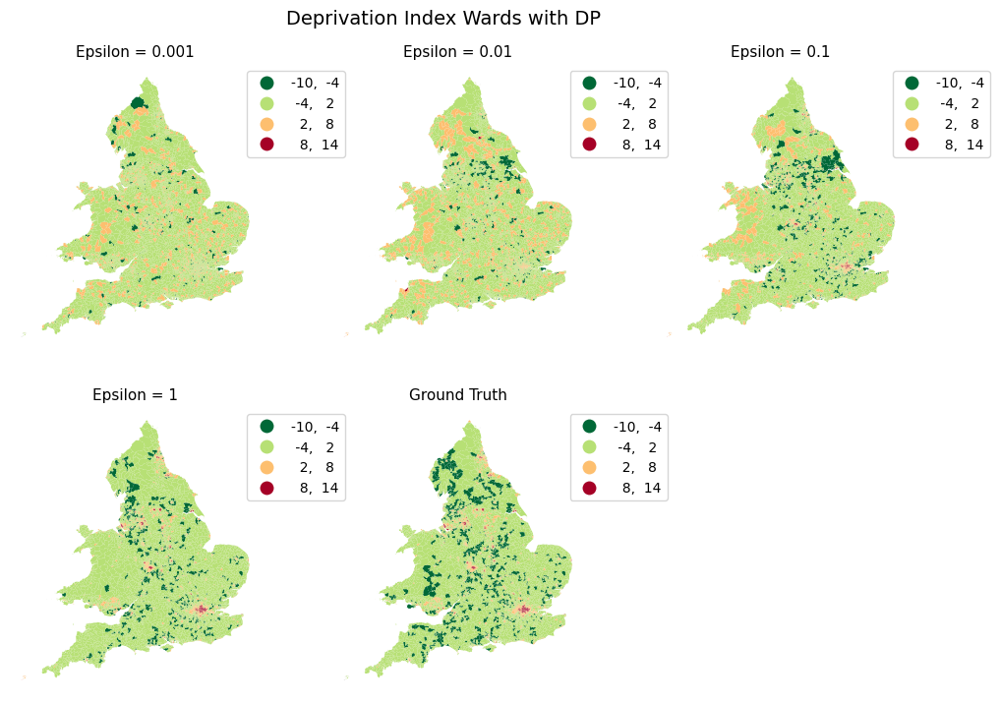

In [56]:
create_maps_interval(
    epsilons_short,
    gdf_geometric_clipping_merged,
    5,
    "deprivation_score",
    cmap_reverse,
    "Deprivation Index Wards with DP",
    "map_deprivation_interval_wards",
)

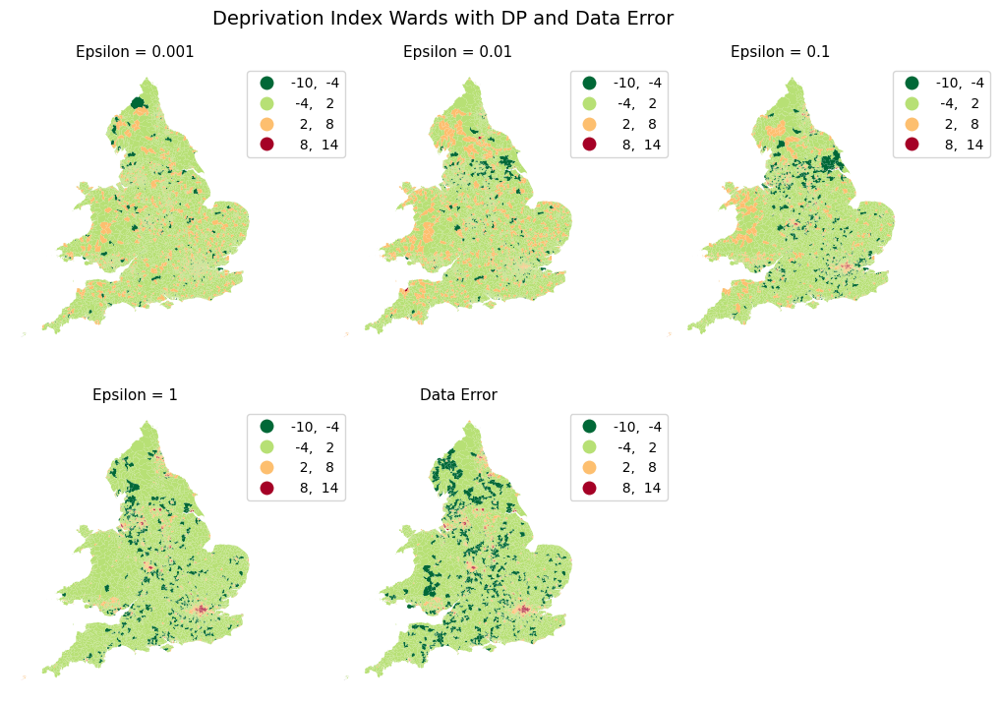

In [57]:
create_maps_interval(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged,
    5,
    "deprivation_score",
    cmap_reverse,
    "Deprivation Index Wards with DP and Data Error",
    "map_deprivation_interval_wards",
    base=True,
    base_name="Data Error",
)

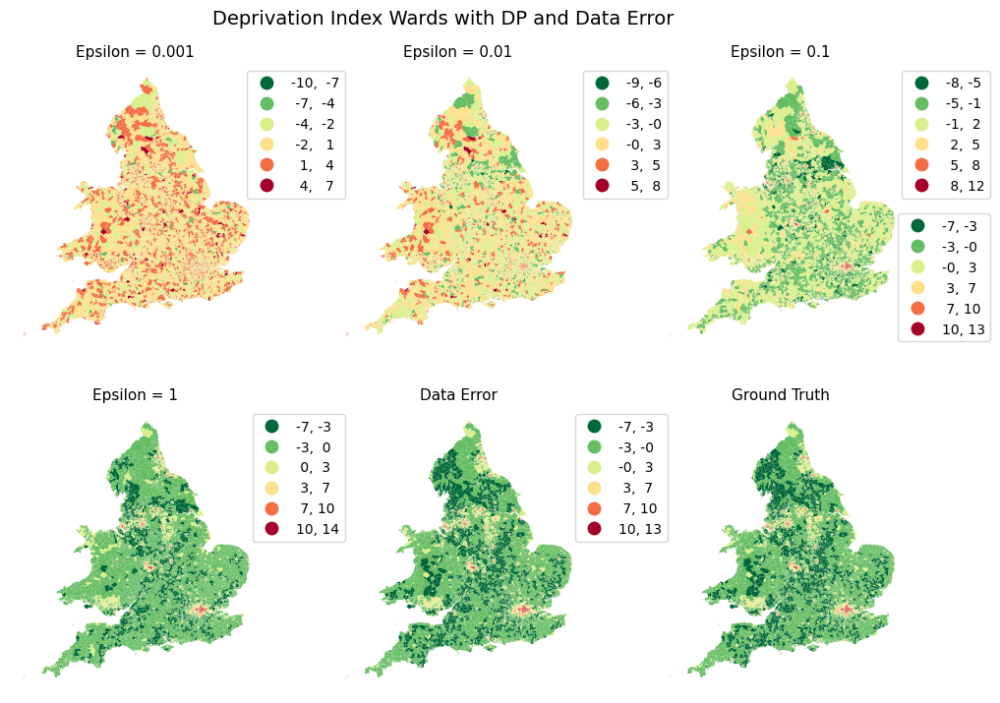

In [58]:
create_maps_interval_data_error_ground_truth_no_norm(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged,
    gdf_geometric_clipping_merged,
    6,
    "deprivation_score",
    cmap_reverse,
    "Deprivation Index Wards with DP and Data Error",
    "map_deprivation_interval_wards_full",
)

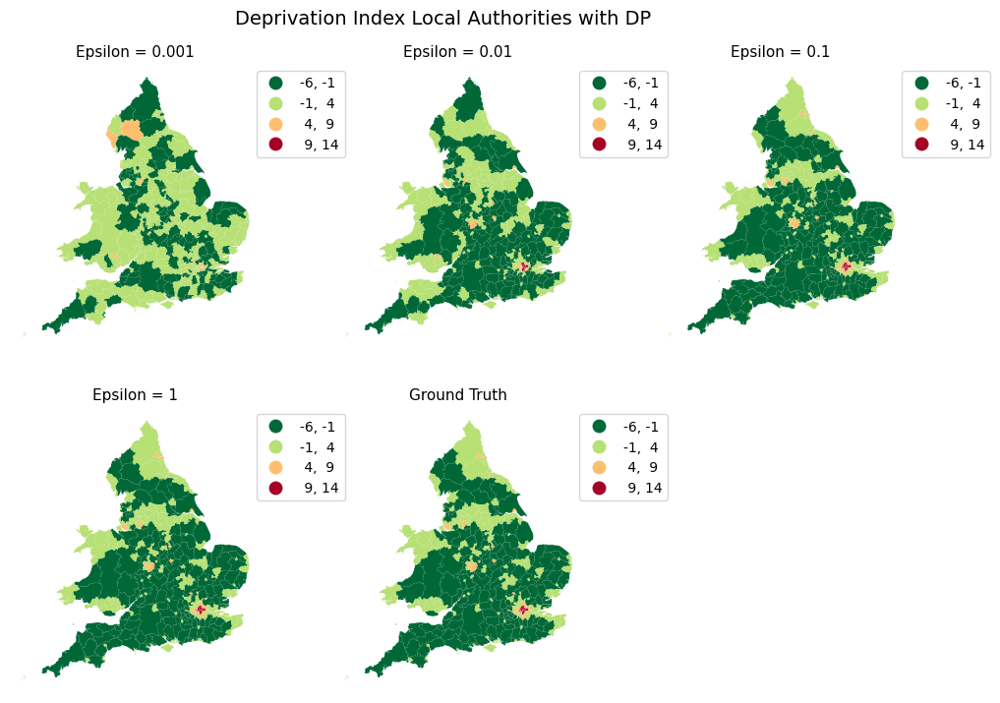

In [59]:
create_maps_interval(
    epsilons_short,
    gdf_geometric_clipping_merged_la,
    5,
    "deprivation_score",
    cmap_reverse,
    "Deprivation Index Local Authorities with DP",
    "map_deprivation_interval_las",
)

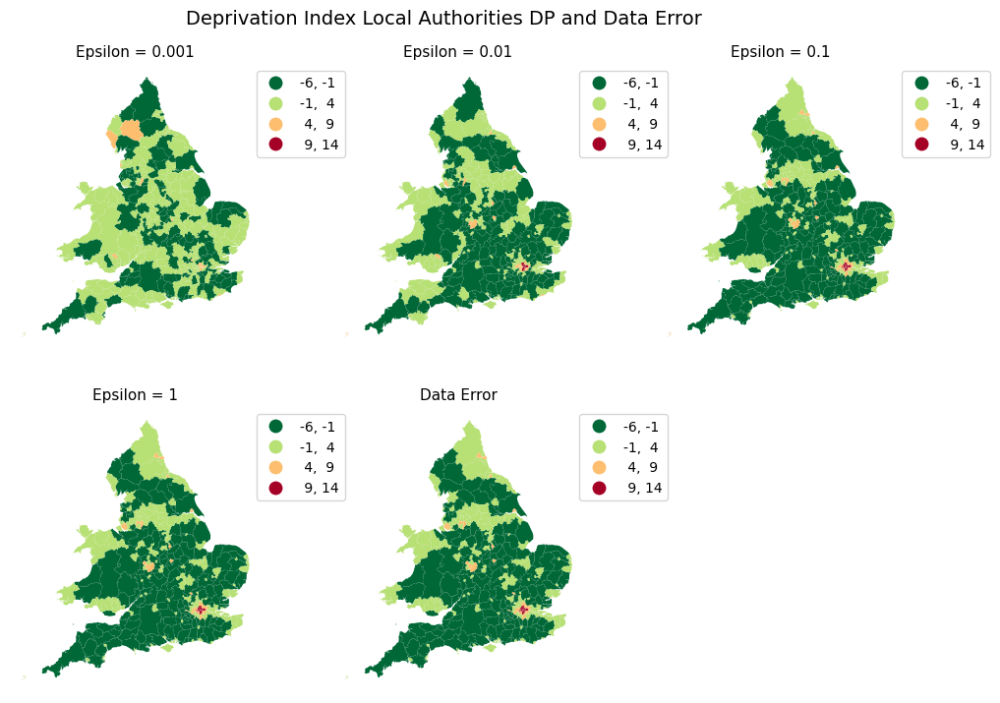

In [60]:
create_maps_interval(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged_la,
    5,
    "deprivation_score",
    cmap_reverse,
    "Deprivation Index Local Authorities DP and Data Error",
    "map_deprivation_interval_las_dp_data_error",
    base=True,
    base_name="Data Error",
)

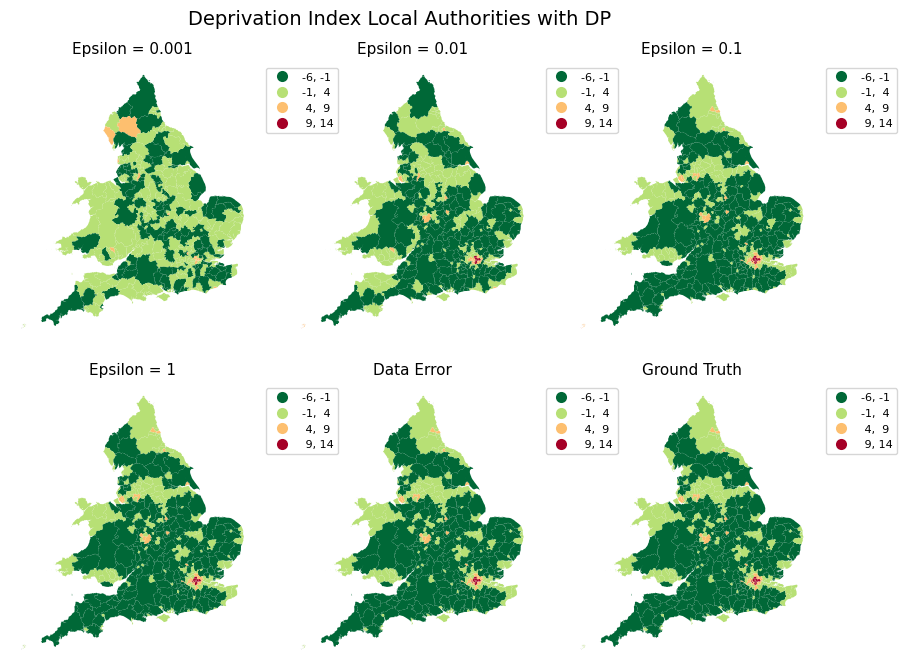

In [61]:
create_maps_interval_data_error_ground_truth(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged_la,
    gdf_geometric_clipping_merged_la,
    5,
    "deprivation_score",
    cmap_reverse,
    "Deprivation Index Local Authorities with DP",
    "map_deprivation_interval_las_full",
)

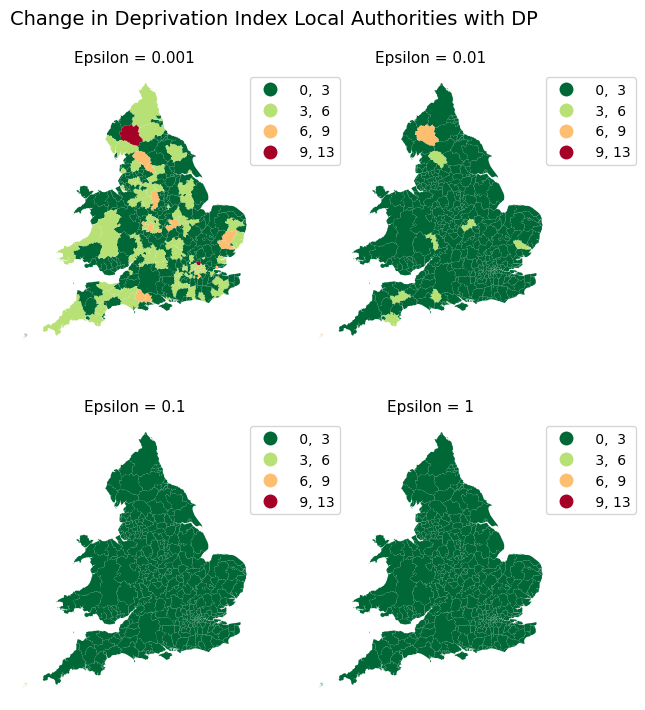

In [62]:
create_maps_interval(
    epsilons_short,
    gdf_geometric_clipping_merged_la,
    5,
    "change_in_score",
    cmap_reverse,
    "Change in Deprivation Index Local Authorities with DP",
    "map_deprivation_interval_las_change_score",
    base=False,
)

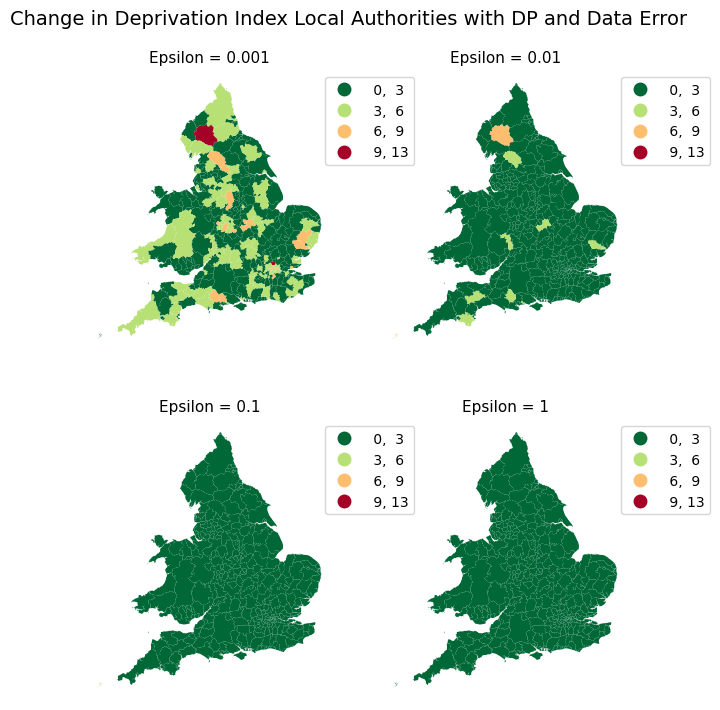

In [63]:
create_maps_interval(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged_la,
    5,
    "change_in_score",
    cmap_reverse,
    "Change in Deprivation Index Local Authorities with DP and Data Error",
    "map_deprivation_interval_las_change_score_dp_data_error",
    base=False,
)

In [64]:
def create_maps_quintiles(
    epsilons,
    measurement_df,
    column_name,
    cmap,
    title,
    file_name,
    base=True,
    base_name="Ground Truth",
    categories=[0, 1, 2, 3, 4],
):

    if base:
        fig, axs = plt.subplots(2, 3, figsize=(12, 8))
        fig.suptitle(title, fontsize=14)

        i = 0
        j = 0

        for epsilon in epsilons:
            if j == 3:
                j = 0
                i += 1
            df = measurement_df.loc[epsilon]
            axs[i][j].set_axis_off()

            df.plot(
                column=column_name,
                ax=axs[i][j],
                cmap=cmap,
                categorical=True,
                categories=categories,
                legend=True,
                legend_kwds={
                    "loc": "upper right",
                    "bbox_to_anchor": (1.2, 1),
                    "fmt": "{:.0f}",
                },
                rasterized=True,
            )

            axs[i][j].set_title(f"Epsilon = {epsilon}", fontsize=11)
            j += 1

        axs[i][j].set_axis_off()
        measurement_df.loc[0].plot(
            column=column_name,
            categorical=True,
            categories=categories,
            ax=axs[i][j],
            cmap=cmap,
            legend=True,
            legend_kwds={
                "loc": "upper right",
                "bbox_to_anchor": (1.2, 1),
                "fmt": "{:.0f}",
            },
            rasterized=True,
        )
        axs[i][j].set_title(base_name, fontsize=11)
        fig.delaxes(axs[i, j + 1])
        plt.subplots_adjust(top=0.91)
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.png")), bbox_inches="tight"
        )
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.svg")), bbox_inches="tight"
        )
    else:
        fig, axs = plt.subplots(2, 2, figsize=(7, 8))
        fig.suptitle(title, fontsize=14)

        i = 0
        j = 0

        for epsilon in epsilons:
            if j == 2:
                j = 0
                i += 1
            df = measurement_df.loc[epsilon]
            axs[i][j].set_axis_off()

            df.plot(
                column=column_name,
                cmap=cmap,
                categorical=True,
                categories=categories,
                ax=axs[i][j],
                legend=True,
                legend_kwds={
                    "loc": "upper right",
                    "bbox_to_anchor": (1.36, 1),
                    "fmt": "{:.0f}",
                },
                rasterized=True,
            )

            axs[i][j].set_title(f"Epsilon = {epsilon}", fontsize=11)
            j += 1

        plt.subplots_adjust(top=0.91)
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.png")), bbox_inches="tight"
        )
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.svg")), bbox_inches="tight"
        )

In [65]:
def create_maps_quintiles_data_error_ground_truth(
    epsilons,
    measurement_df_data_error,
    measurement_df,
    column_name,
    cmap,
    title,
    file_name,
    categories=[0, 1, 2, 3, 4],
):

    fig, axs = plt.subplots(2, 3, figsize=(10.5, 7.5))
    fig.suptitle(title, fontsize=14)

    i = 0
    j = 0

    for epsilon in epsilons:
        if j == 3:
            j = 0
            i += 1
        df = measurement_df_data_error.loc[epsilon]
        axs[i][j].set_axis_off()

        p1 = df.plot(
            column=column_name,
            ax=axs[i][j],
            cmap=cmap,
            categorical=True,
            categories=categories,
            legend=True,
            legend_kwds={
                "loc": "upper right",
                "bbox_to_anchor": (1.2, 1),
                "fmt": "{:.0f}",
            },
            rasterized=True,
        )

        axs[i][j].set_title(f"Epsilon = {epsilon}", fontsize=11)
        j += 1

    # creating map for data error
    axs[i][j].set_axis_off()
    p2 = measurement_df_data_error.loc[0].plot(
        column=column_name,
        categorical=True,
        categories=categories,
        ax=axs[i][j],
        cmap=cmap,
        legend=True,
        legend_kwds={"loc": "upper right", "bbox_to_anchor": (1.2, 1), "fmt": "{:.0f}"},
        rasterized=True,
    )
    axs[i][j].set_title("Data Error", fontsize=11)

    # creating map for ground truth
    axs[i][j + 1].set_axis_off()

    p3 = measurement_df.loc[0].plot(
        column=column_name,
        categorical=True,
        ax=axs[i][j + 1],
        cmap=cmap,
        legend=True,
        legend_kwds={
            "loc": "upper right",
            "bbox_to_anchor": (1.2, 1),
            "fmt": "{:.0f}",
            "fontsize": 10,
            "frameon": True,
        },
        rasterized=True,
    )
    axs[i][j + 1].set_title("Ground Truth", fontsize=11)

    fig.subplots_adjust(top=0.91, wspace=0.0, hspace=0.15)

    plt.savefig(
        (os.path.join(fig_folder_name, f"{file_name}.png")), bbox_inches="tight"
    )
    plt.savefig(
        (os.path.join(fig_folder_name, f"{file_name}.svg")), bbox_inches="tight"
    )

In [66]:
def create_maps_quintiles_data_error_ground_truth_region(
    epsilons,
    measurement_df_data_error,
    measurement_df,
    column_name,
    cmap,
    title,
    file_name,
    categories=[0, 1, 2, 3, 4],
):

    fig, axs = plt.subplots(2, 3, figsize=(10.5, 6.7))
    fig.suptitle(title, fontsize=14)

    i = 0
    j = 0

    for epsilon in epsilons:
        if j == 3:
            j = 0
            i += 1
        df = measurement_df_data_error.loc[epsilon]
        axs[i][j].set_axis_off()

        df.plot(
            column=column_name,
            ax=axs[i][j],
            cmap=cmap,
            categorical=True,
            categories=categories,
            legend=True,
            legend_kwds={
                "loc": "lower left",
                "ncol": 3,
                "bbox_to_anchor": (0.2, -0.2),
                "fmt": "{:.0f}",
                "fontsize": 8,
                "markerscale": 0.8,
            },
            rasterized=True,
        )

        axs[i][j].set_title(f"Epsilon = {epsilon}", fontsize=11)
        j += 1

    # creating map for data error
    axs[i][j].set_axis_off()
    measurement_df_data_error.loc[0].plot(
        column=column_name,
        categorical=True,
        categories=categories,
        ax=axs[i][j],
        cmap=cmap,
        legend=True,
        legend_kwds={
            "loc": "lower left",
            "ncol": 3,
            "bbox_to_anchor": (0.2, -0.2),
            "fmt": "{:.0f}",
            "fontsize": 8,
            "markerscale": 0.8,
        },
        rasterized=True,
    )
    axs[i][j].set_title("Data Error", fontsize=11)

    # creating map for ground truth
    axs[i][j + 1].set_axis_off()

    measurement_df.loc[0].plot(
        column=column_name,
        categorical=True,
        ax=axs[i][j + 1],
        cmap=cmap,
        legend=True,
        legend_kwds={
            "loc": "lower left",
            "ncol": 3,
            "bbox_to_anchor": (0.2, -0.2),
            "fmt": "{:.0f}",
            "fontsize": 8,
            "markerscale": 0.8,
        },
        rasterized=True,
    )
    axs[i][j + 1].set_title("Ground Truth", fontsize=11)

    fig.subplots_adjust(top=0.93, wspace=0.0, hspace=0.1)

    plt.savefig(
        (os.path.join(fig_folder_name, f"{file_name}.png")), bbox_inches="tight"
    )
    plt.savefig(
        (os.path.join(fig_folder_name, f"{file_name}.svg")), bbox_inches="tight"
    )

In [67]:
def create_maps_quintiles_region(
    epsilons,
    measurement_df,
    column_name,
    cmap,
    title,
    file_name,
    base=True,
    base_name="Ground Truth",
    categories=[0, 1, 2, 3, 4],
):

    if base:
        fig, axs = plt.subplots(2, 3, figsize=(5.4, 3))
        fig.suptitle(title, fontsize=14)

        i = 0
        j = 0

        for epsilon in epsilons:
            if j == 3:
                j = 0
                i += 1
            df = measurement_df.loc[epsilon]
            axs[i][j].set_axis_off()

            df.plot(
                column=column_name,
                ax=axs[i][j],
                cmap=cmap,
                categorical=True,
                categories=categories,
                legend=True,
                legend_kwds={
                    "loc": "lower left",
                    "ncol": len(categories) / 2,
                    "bbox_to_anchor": (0, -0.4),
                    "fmt": "{:.0f}",
                    "fontsize": 8,
                    "markerscale": 0.8,
                },
                rasterized=True,
            )

            axs[i][j].set_title(f"Epsilon = {epsilon}", fontsize=11)
            j += 1

        axs[i][j].set_axis_off()
        measurement_df.loc[0].plot(
            column=column_name,
            categorical=True,
            categories=categories,
            ax=axs[i][j],
            cmap=cmap,
            legend=True,
            legend_kwds={
                "loc": "lower left",
                "ncol": len(categories) / 2,
                "bbox_to_anchor": (0, -0.4),
                "fmt": "{:.0f}",
                "fontsize": 8,
                "markerscale": 0.8,
            },
            rasterized=True,
        )
        axs[i][j].set_title(base_name, fontsize=11)
        fig.delaxes(axs[i, j + 1])
        plt.subplots_adjust(top=0.93, wspace=0.0, hspace=0.1)
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.png")), bbox_inches="tight"
        )
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.svg")), bbox_inches="tight"
        )
    else:
        fig, axs = plt.subplots(2, 2, figsize=(7, 8))
        fig.suptitle(title, fontsize=14)

        i = 0
        j = 0

        for epsilon in epsilons:
            if j == 2:
                j = 0
                i += 1
            df = measurement_df.loc[epsilon]
            axs[i][j].set_axis_off()

            df.plot(
                column=column_name,
                cmap=cmap,
                categorical=True,
                categories=categories,
                ax=axs[i][j],
                legend=True,
                legend_kwds={
                    "loc": "lower left",
                    "ncol": len(categories) / 2,
                    "bbox_to_anchor": (0, -0.4),
                    "fmt": "{:.0f}",
                    "fontsize": 8,
                    "markerscale": 0.8,
                },
                rasterized=True,
            )

            axs[i][j].set_title(f"Epsilon = {epsilon}", fontsize=11)
            j += 1

        plt.subplots_adjust(top=0.99, wspace=0.0, hspace=0)
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.png")), bbox_inches="tight"
        )
        plt.savefig(
            (os.path.join(fig_folder_name, f"{file_name}.svg")), bbox_inches="tight"
        )

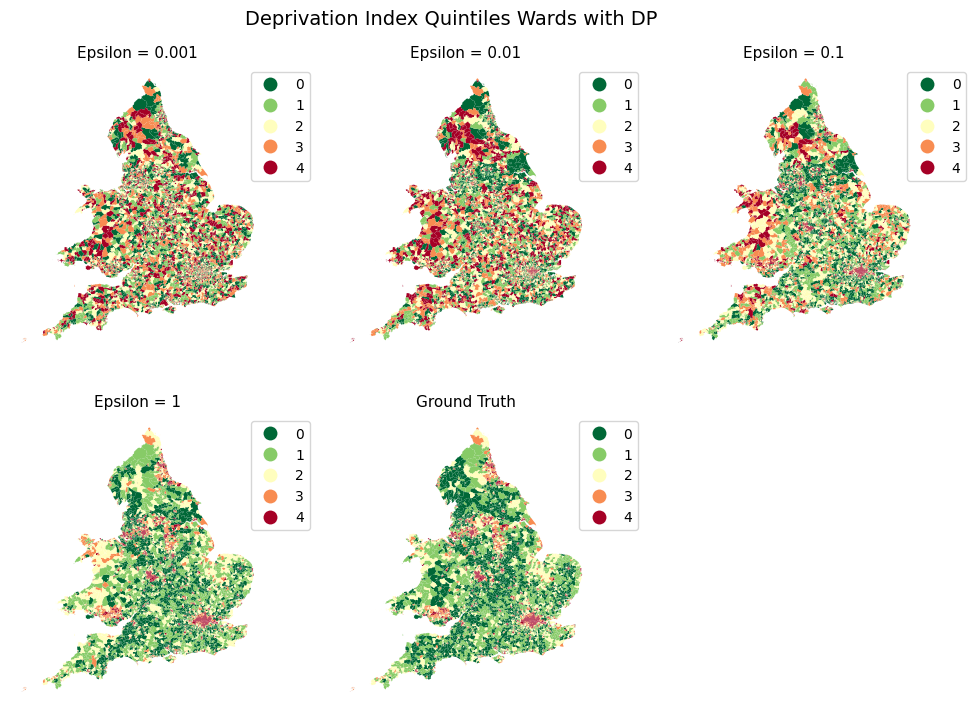

In [68]:
create_maps_quintiles(
    epsilons_short,
    gdf_geometric_clipping_merged,
    "quantile",
    cmap_reverse,
    "Deprivation Index Quintiles Wards with DP",
    "map_deprivation_quintiles_wards",
)

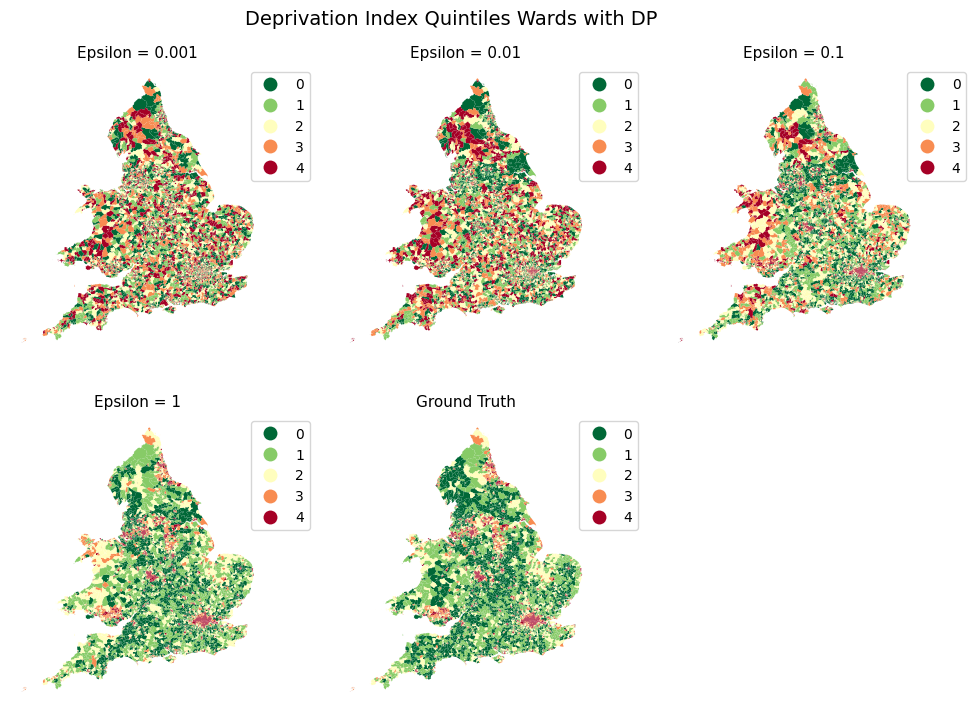

In [69]:
create_maps_quintiles(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged,
    "quantile",
    cmap_reverse,
    "Deprivation Index Quintiles Wards with DP",
    "map_deprivation_quintiles_wards",
)

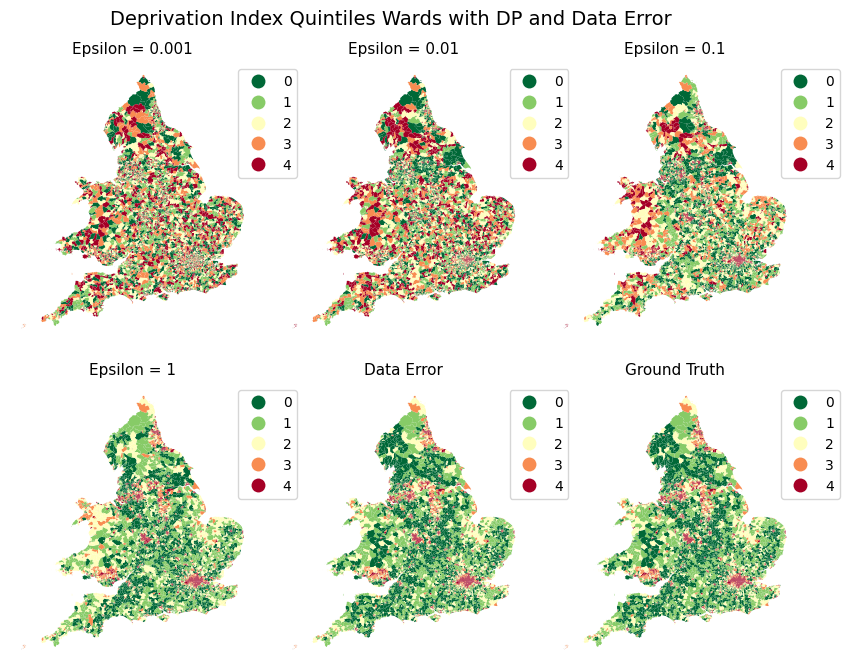

In [70]:
create_maps_quintiles_data_error_ground_truth(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged,
    gdf_geometric_clipping_merged,
    "quantile",
    cmap_reverse,
    "Deprivation Index Quintiles Wards with DP and Data Error",
    "map_deprivation_quintiles_wards_full",
)

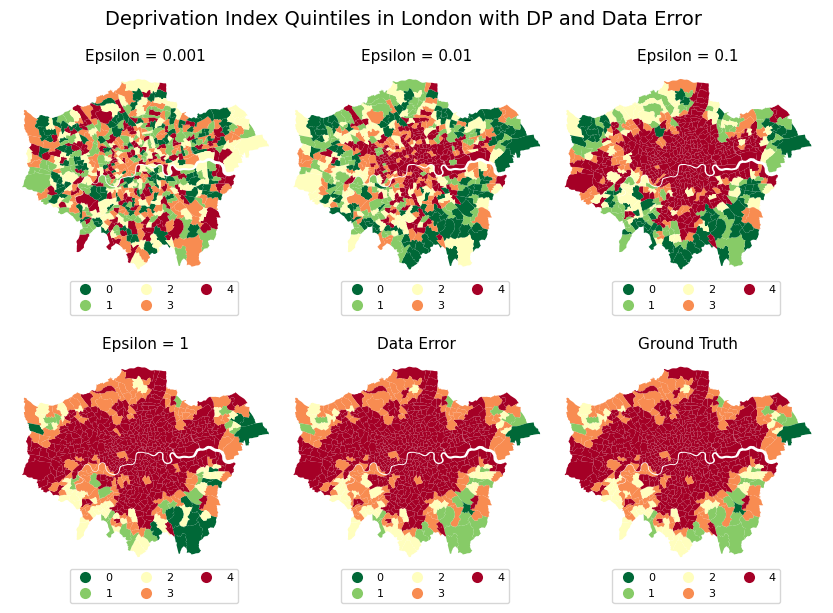

In [71]:
create_maps_quintiles_data_error_ground_truth_region(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged_london,
    gdf_geometric_clipping_merged_london,
    "quantile",
    cmap_reverse,
    "Deprivation Index Quintiles in London with DP and Data Error",
    "map_deprivation_quintiles_london",
)

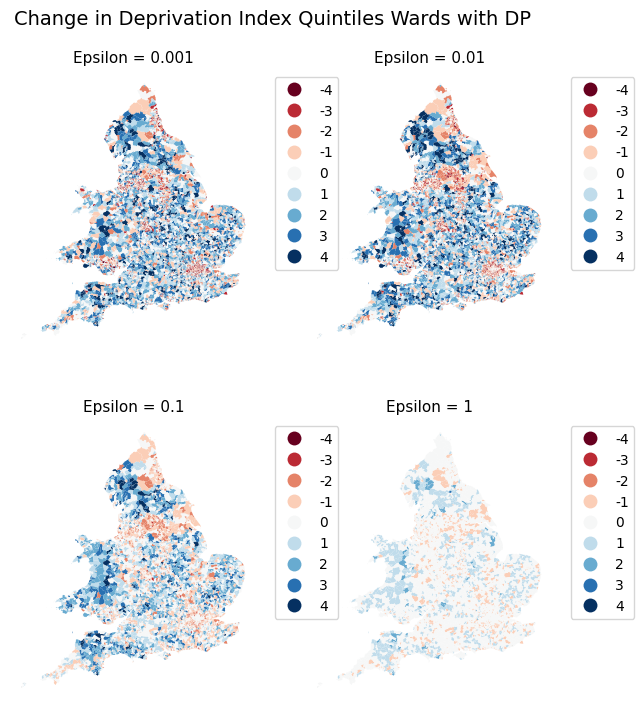

In [72]:
create_maps_quintiles(
    epsilons_short,
    gdf_geometric_clipping_merged,
    "change_in_quantile",
    "RdBu",
    "Change in Deprivation Index Quintiles Wards with DP",
    "map_deprivation_quintiles_wards_change_quintiles",
    base=False,
    categories=[-4, -3, -2, -1, 0, 1, 2, 3, 4],
)

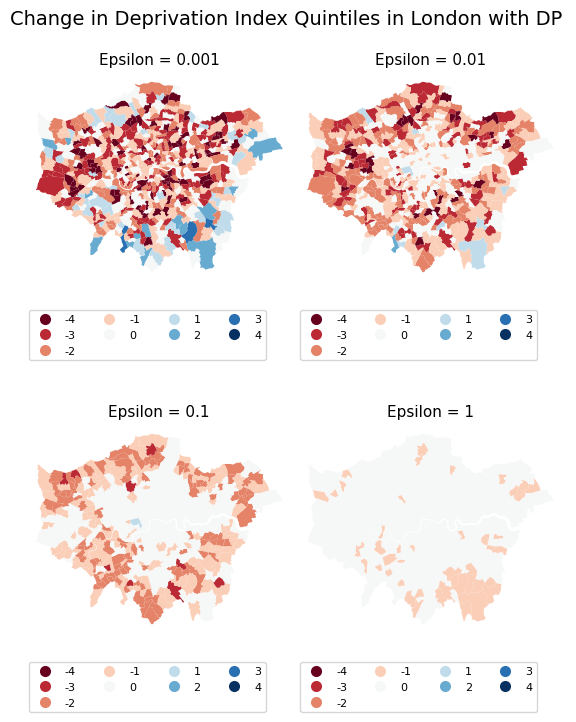

In [73]:
create_maps_quintiles_region(
    epsilons_short,
    gdf_geometric_clipping_merged_london,
    "change_in_quantile",
    "RdBu",
    "Change in Deprivation Index Quintiles in London with DP",
    "map_deprivation_quintiles_change_quintiles_london",
    base=False,
    categories=[-4, -3, -2, -1, 0, 1, 2, 3, 4],
)

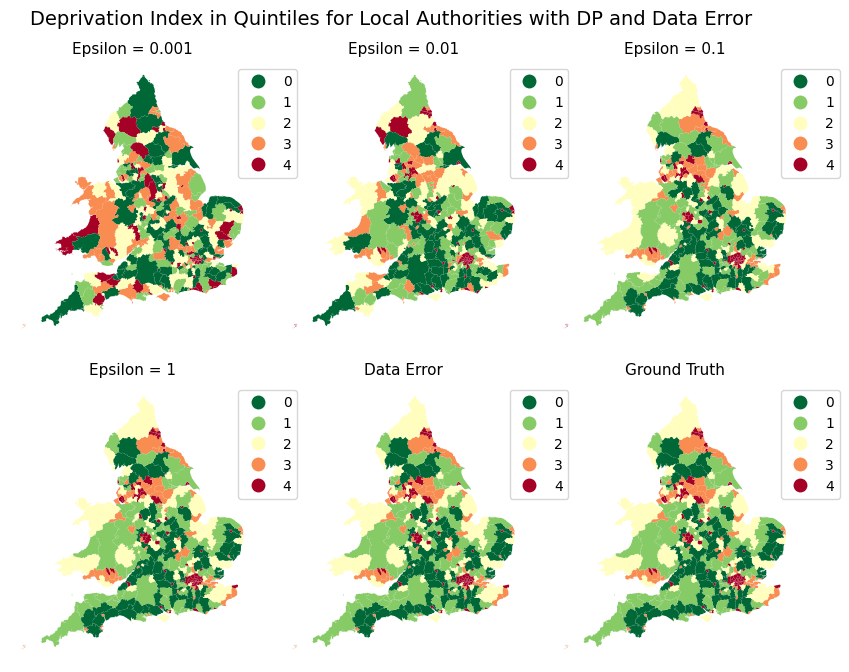

In [74]:
create_maps_quintiles_data_error_ground_truth(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged_la,
    gdf_geometric_clipping_merged_la,
    "quantile",
    cmap_reverse,
    "Deprivation Index in Quintiles for Local Authorities with DP and Data Error",
    "map_deprivation_quintiles_las_full",
)

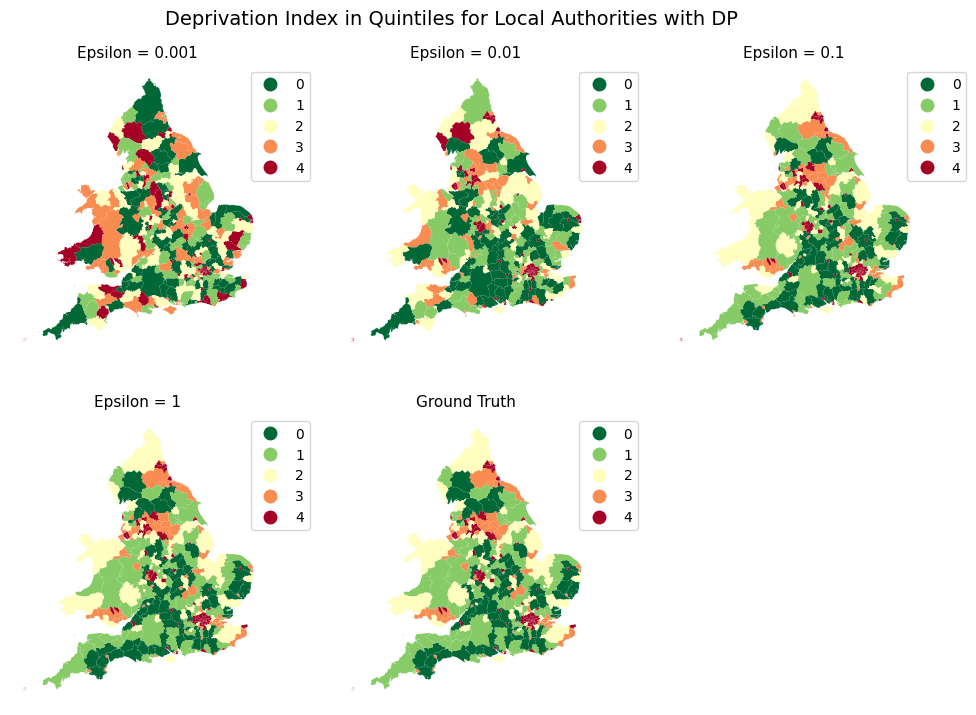

In [75]:
create_maps_quintiles(
    epsilons_short,
    gdf_geometric_clipping_merged_la,
    "quantile",
    cmap_reverse,
    "Deprivation Index in Quintiles for Local Authorities with DP",
    "map_deprivation_quintiles_las",
)

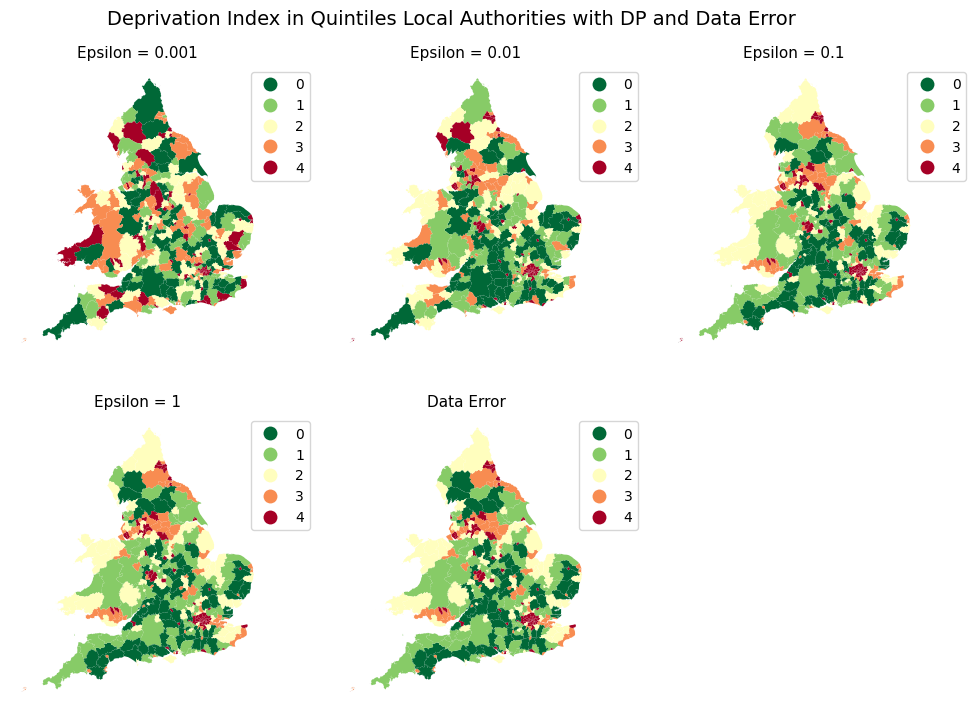

In [76]:
create_maps_quintiles(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged_la,
    "quantile",
    cmap_reverse,
    "Deprivation Index in Quintiles Local Authorities with DP and Data Error",
    "map_deprivation_quintiles_las_dp_data_error",
    base=True,
    base_name="Data Error",
)

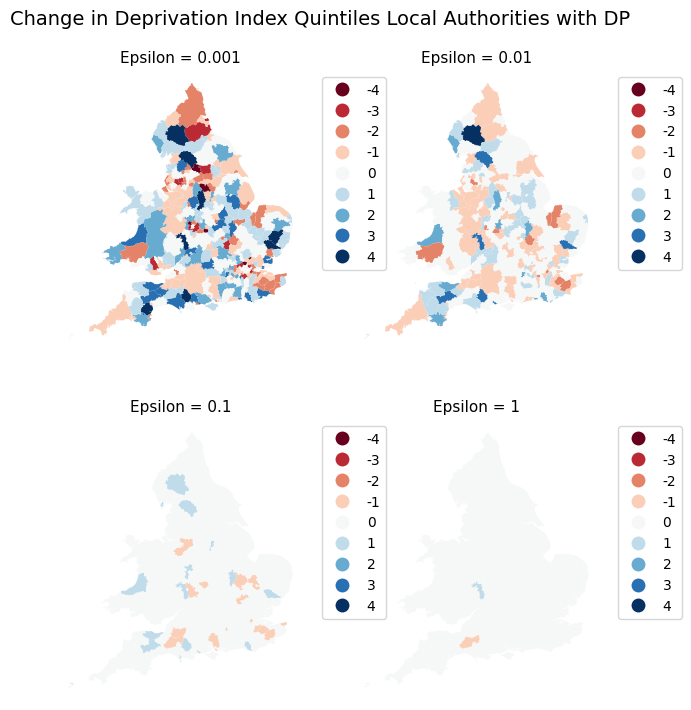

In [77]:
create_maps_quintiles(
    epsilons_short,
    gdf_geometric_clipping_merged_la,
    "change_in_quantile",
    "RdBu",
    "Change in Deprivation Index Quintiles Local Authorities with DP",
    "map_deprivation_quintiles_la_change_quintiles",
    base=False,
    categories=[-4, -3, -2, -1, 0, 1, 2, 3, 4],
)

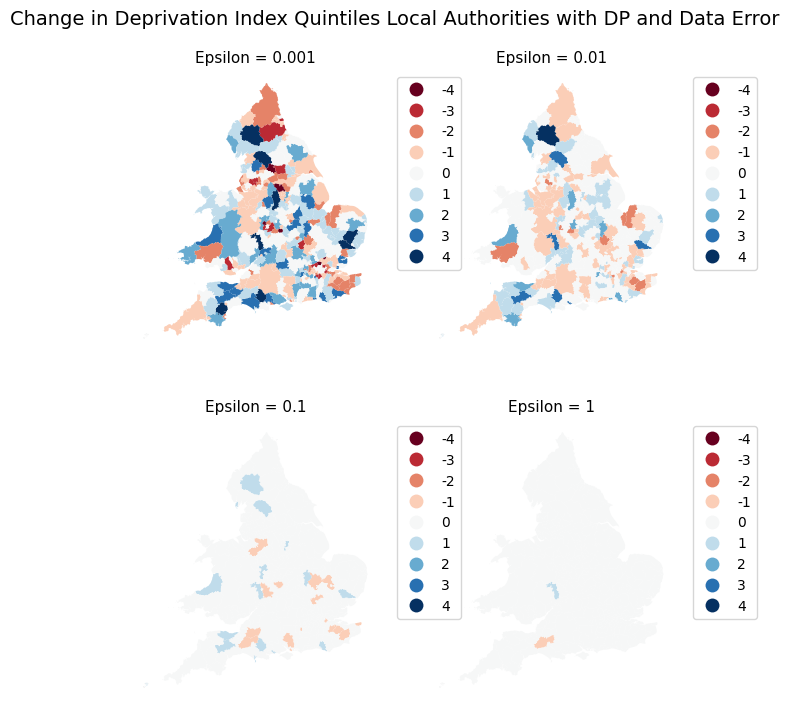

In [78]:
create_maps_quintiles(
    epsilons_short,
    gdf_geometric_clipping_data_error_merged_la,
    "change_in_quantile",
    "RdBu",
    "Change in Deprivation Index Quintiles Local Authorities with DP and Data Error",
    "map_deprivation_quintiles_la_change_quintiles_dp_data_error",
    base=False,
    categories=[-4, -3, -2, -1, 0, 1, 2, 3, 4],
)

<Axes: >

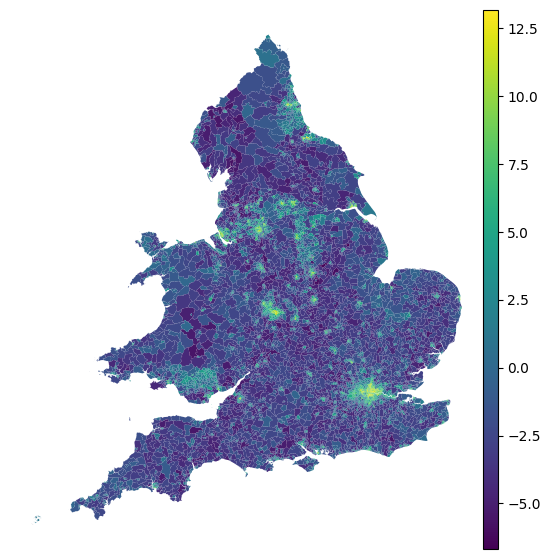

In [79]:
fig, ax = plt.subplots(1, 1, figsize=(10, 7))
ax.set_axis_off()
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.0)
gdf_wards_measurements.plot(column="deprivation_score", ax=ax, legend=True, cax=cax)